# 1. Set Up Notebook and Load Data 

In [1]:
# PYTHON Imports 
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
import math
import statistics
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from mpl_toolkits.mplot3d import Axes3D
from pathlib import Path
import glob
import os
import ipywidgets as widgets
from IPython.display import clear_output
import sys
import time
import json
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import fnmatch
import pickle
import tensorflow as tf 



# CUSTOM Imports
def list_folders_fun(path):
    """
    DESCRIPTION: List folders in a given directory.
    INPUT: Directory path
    OUTPUT: Folder names in a given directory
    """
    folder_list = [f.name for f in Path(path).iterdir() if f.is_dir()]
    return folder_list

# Specify global path
global_path = '/Users/steven/Library/Mobile Documents/com~apple~CloudDocs/0-CfA/4-Data/Datasets'
global_folders = list_folders_fun(global_path)

# Select dataset
set_widget = widgets.Dropdown(options=global_folders[:],value=global_folders[0],description='Set :',disabled=False); set_widget

Dropdown(description='Set :', options=('Full', 'All', 'Full_extra', 'New', 'Bona'), value='Full')

In [2]:
# Set ID
set_id = set_widget.value
# Select Input
files = os.listdir(f'{global_path}/{set_id}/')
input_files = [f for f in files if fnmatch.fnmatch(f, 'hist2D*24*minmax*')]
# input_files = [f for f in files if fnmatch.fnmatch(f, 'hist3D*24*minmax*')]
# input_files = [f for f in files if fnmatch.fnmatch(f, 'hist2D*24*none*')]
# input_files = [f for f in files if fnmatch.fnmatch(f, 'hist3D*24*none*')]
input_widget = widgets.Dropdown(options=input_files[:],value=input_files[0],description='TSNE File :',disabled=False); input_widget

Dropdown(description='TSNE File :', options=('hist2D-Full-nE16-nt24-normminmax.pkl',), value='hist2D-Full-nE16…

In [3]:
# Load features
input_file = input_widget.value
with open(f'{global_path}/{set_id}/{input_file}', 'rb') as f:
    hist_dict = pickle.load(f)
ids = list(hist_dict.keys())
histograms = hist_dict.values()
features = np.array([np.array(h) for h in histograms])
# Load properties
df_properties_input = pd.read_csv(f'{global_path}/{set_id}/properties-input-{set_id}.csv')
df_properties_input = df_properties_input[df_properties_input['obsreg_id'].isin(list(ids))]
df_properties = df_properties_input.drop_duplicates('obsreg_id', keep='first').reset_index(drop=True)
df_eventfiles_input = pd.read_csv(f'{global_path}/{set_id}/eventfiles-input-{set_id}.csv')
df_properties_global = pd.read_csv(f'{global_path}/{set_id}/properties-{set_id}.csv')
df_properties_global['obsreg_id'] = df_properties_global['obsid'].astype(str) + '_' + df_properties_global['region_id'].astype(str)
df_eventfiles_group = df_eventfiles_input.groupby('obsreg_id')
df_properties_group = df_properties_input.groupby('obsreg_id')
# Data
df_label = df_properties.copy()
ID = df_label['obsreg_id'].values
X = features
# Print Summary
print("Number of Features: ", len(features))
print("Number of Property Sets: ", len(df_properties))


Number of Features:  95473
Number of Property Sets:  95473


In [4]:
# Select saved model
files = os.listdir(f'{global_path}/{set_id}/')
encode_files = [f for f in files if fnmatch.fnmatch(f, '*-ENCODER*2D*CNN*fc[*neck*b*reg*reg*sex*h5')]
encode_files = [f for f in files if fnmatch.fnmatch(f, '*-ENCODER*2D*CNN*fc[*neck8*minmax*h5')]
encode_files = [f for f in files if fnmatch.fnmatch(f, '*-ENCODER*2D*CNN*fc[*neck6*zoro*h5')]
encode_files = [f for f in files if fnmatch.fnmatch(f, '*-ENCODER*2D*CNN*fc[*neck12*xae*h5')]
# encode_files = [f for f in files if fnmatch.fnmatch(f, '*-ENCODER*3D*FC*fc[*h5')]
encode_widget = widgets.Dropdown(options=encode_files[:],value=encode_files[-1],description='Encoder :',disabled=False,style = {'description_width': 'initial'}); encode_widget 

Dropdown(description='Encoder :', options=('XAE-ENCODER-2D-CNN-cn[32, 16]-fc[192, 48]-neck12-lr0.001-b1024-reg…

In [5]:
e = encode_widget.value
print(e)
encoder_model = tf.keras.models.load_model(f'{global_path}/{set_id}/{e}')
embedding = encoder_model.predict(X)
# embedding = np.array([np.array(e).flatten() for e in embedding])
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
embedding2 = scaler.fit_transform(embedding)


XAE-ENCODER-2D-CNN-cn[32, 16]-fc[192, 48]-neck12-lr0.001-b1024-reg0.0-botreg0.1-kernhe_normal-xae-rs505.h5
Metal device set to: Apple M2 Pro

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB



2023-05-14 22:59:41.449751: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


2984/2984 [==============================] - 12s 4ms/step


In [48]:
perp = 60
learn_rate = 120
early_exag = 1
iterations = 1500
random_state = 2020
init = 'random'
tsne_model = TSNE(n_components = 2, perplexity = perp, learning_rate = learn_rate, n_iter = iterations, early_exaggeration = early_exag, init=init, random_state=random_state) # rosanne 78592 #lin 27514
X_tsne = tsne_model.fit_transform(embedding2) 
df_tsne = pd.DataFrame(X_tsne, columns=['tsne1', 'tsne2'])
df_tsne['obsreg_id'] = ID

tsne_name = e[:-3]
tsne_path = f'{global_path}/{set_id}/{tsne_name}-TSNE{init}-lr{learn_rate}-perp{perp}-it{iterations}-ee{early_exag}-rs{random_state}.csv'
df_tsne.to_csv(tsne_path, index=False)

In [39]:
# Select saved model
files = os.listdir(f'{global_path}/{set_id}/')
TSNE_files = [f for f in files if fnmatch.fnmatch(f, '*-ENCODER*2D*CNN*fc[*b*reg*reg*xae*-TSNE*rs*.csv')]
# TSNE_files = [f for f in files if fnmatch.fnmatch(f, '*-ENCODER*2D*CNN*fc[*neck8*minmax*-TSNE*rs*.csv')]
# TSNE_files = [f for f in files if fnmatch.fnmatch(f, '*-ENCODER*3D*TSNE*.csv')]
# encode_files = [f for f in files if fnmatch.fnmatch(f, '*-ENCODER*3D*FC*fc[*h5')]
tsne_widget = widgets.Dropdown(options=TSNE_files[:],value=TSNE_files[-1],description='tsne :',disabled=False,style = {'description_width': 'initial'}); tsne_widget 

Dropdown(description='tsne :', index=59, options=('XAE-ENCODER-2D-CNN-cn[32, 16]-fc[192, 48]-neck12-lr0.001-b1…

In [40]:
t = f'{global_path}/{set_id}/{tsne_widget.value}'
df_tsne = pd.read_csv(t)
print(t)

flares_maybe = ['10542_331','10556_6687','10556_5752','10556_6687']
dips_maybe = ['13814_586','13813_218']
# DIPS ET AL
parmar = ['10783_10','10871_10','11059_10','9070_10'] # LMXB dips!
distefano = ['13814_567']
m101ulx = ['4736_81','6170_74','4733_229','4737_74','5300_95','5322_229','6152_81']
ieva = ['11272_13','13812_586','13812_218','9550_17','942_101','6152_79']
# FLARES ET AL 
lin = ['4062_31', '13454_56','20635_58'] 
xue = ['957_208', '3389_274','15211_38']
irwin = ['3926_13','7800_4','7799_16','8490_30']
glennie = ['12884_10']
jonker = ['803_90']
vasquez = ['2025_39','9546_17','9548_14','12264_54','15113_59']
vasquez = ['2025_39','9548_14','15113_59']
nandra = ['9875_166', '9456_274', '5849_62']
goulding =['8636_2', '8636_3'] # last one not listed 2012 2015
flares = ['4395_992','16444_1025','13637_1078','14368_489','14368_503','10822_185','10955_21','10996_5','2833_53','13610_112','15214_29','1042_24']
NEW = ['23022_122']

tsne_lin = df_tsne.loc[df_tsne['obsreg_id'].isin(lin)]
tsne_irwin = df_tsne.loc[df_tsne['obsreg_id'].isin(irwin)]
tsne_glennie = df_tsne.loc[df_tsne['obsreg_id'].isin(glennie)]
tsne_jonker = df_tsne.loc[df_tsne['obsreg_id'].isin(jonker)]
tsne_vasquez = df_tsne.loc[df_tsne['obsreg_id'].isin(vasquez)]
tsne_xue = df_tsne.loc[df_tsne['obsreg_id'].isin(xue)]
tsne_goulding = df_tsne.loc[df_tsne['obsreg_id'].isin(goulding)]
tsne_nandra = df_tsne.loc[df_tsne['obsreg_id'].isin(nandra)]
tsne_flares = df_tsne.loc[df_tsne['obsreg_id'].isin(flares + flares_maybe)]

tsne_m101ulx = df_tsne.loc[df_tsne['obsreg_id'].isin(m101ulx)]
tsne_distefano = df_tsne.loc[df_tsne['obsreg_id'].isin(distefano)]
tsne_moredips = df_tsne.loc[df_tsne['obsreg_id'].isin(ieva + dips_maybe)]
tsne_parmar = df_tsne.loc[df_tsne['obsreg_id'].isin(parmar)] # LMXB

tsne_new = df_tsne.loc[df_tsne['obsreg_id'].isin(NEW)] 

/Users/steven/Library/Mobile Documents/com~apple~CloudDocs/0-CfA/4-Data/Datasets/Full/XAE-ENCODER-2D-CNN-cn[32, 16]-fc[192, 48]-neck12-lr0.001-b1024-reg0.0-botreg0.1-kernhe_normal-xae-rs505-TSNErandom-lr120-perp60-it1500-ee1-rs2222.csv


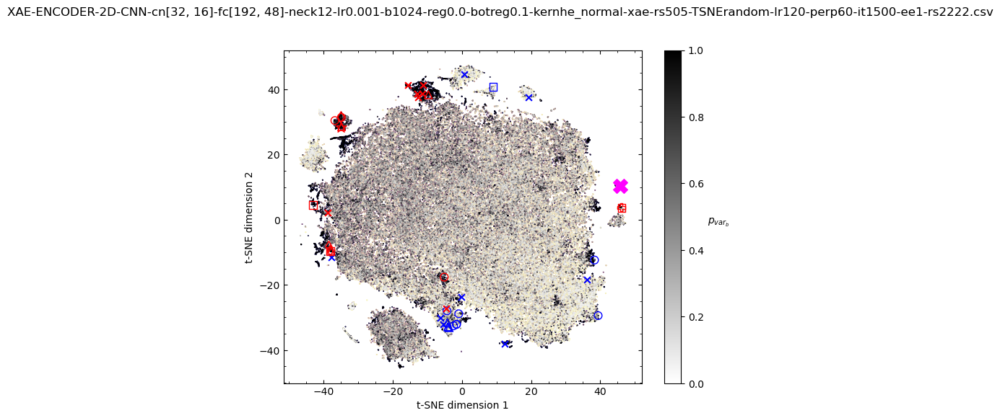

In [43]:
fig, axs = plt.subplots(figsize=(8, 6))
fig.suptitle(tsne_widget.value)
var_b = axs.scatter(df_tsne['tsne1'], df_tsne['tsne2'],c=df_label['var_prob_b'], s=0.1, cmap='plasma_r')
var_b = axs.scatter(df_tsne['tsne1'], df_tsne['tsne2'],c=df_label['var_prob_b'], s=0.1, cmap='binary')
# var_b = axs.scatter(df_tsne['tsne1'], df_tsne['tsne2'],c=df_label['hard_hs'], s=0.1, cmap='plasma_r')
axs.set_xlabel('t-SNE dimension 1')
axs.set_ylabel('t-SNE dimension 2')
axs.grid(False) 
cbar = axs.figure.colorbar(var_b, ax=axs)
cbar.ax.set_ylabel(r'$p_{var_b}$', rotation = 0,labelpad=15)
axs.minorticks_on()
axs.tick_params(which='both', direction='in', top=True, right=True)

markersize = 40
c_f = 'red'
c_d = 'blue'

axs.scatter(tsne_distefano['tsne1'], tsne_distefano['tsne2'], edgecolors=c_d, marker='s', s=markersize*1.5, facecolor='none', label='di Stefano et al. (2021)')
axs.scatter(tsne_m101ulx['tsne1'], tsne_m101ulx['tsne2'], edgecolors=c_d, marker='o', s=markersize*1.5, facecolor='none', label='2E 1402.4+5440 (ULX)')
axs.scatter(tsne_parmar['tsne1'], tsne_parmar['tsne2'], edgecolors=c_d, marker='^', s=markersize*1.5, facecolor='none', label='V* UY Vol (LMXB)')
axs.scatter(tsne_moredips['tsne1'], tsne_moredips['tsne2'], c=c_d, marker='x', s=markersize*1, facecolor='none', label='Other Dips')
 
axs.scatter(tsne_lin['tsne1'], tsne_lin['tsne2'], edgecolors=c_f, marker='s', s=markersize*1.5, facecolor='none', label='Lin et al. (2022)')
axs.scatter(tsne_vasquez['tsne1'], tsne_vasquez['tsne2'], edgecolors=c_f, marker='o', s=markersize*1.5, facecolors='none', label='Quirola et al. (2022)')
axs.scatter(tsne_xue['tsne1'], tsne_xue['tsne2'], edgecolors=c_f, marker='^', s=markersize*1.5, facecolor='none', label='Xue et al. (2019)')
axs.scatter(tsne_flares['tsne1'], tsne_flares['tsne2'], c=c_f, marker='x', s=markersize*1, facecolor='none', label='Other Flares')
axs.scatter(tsne_nandra['tsne1'], tsne_nandra['tsne2'], edgecolors=c_f, marker='d', s=markersize*1.5, facecolor='none', label='Nandra et al. (2015)')
axs.scatter(tsne_glennie['tsne1'], tsne_glennie['tsne2'], edgecolors=c_f, marker='P', s=markersize*1.5, facecolor='none', label='Glennie et al. (2015)')
axs.scatter(tsne_jonker['tsne1'], tsne_jonker['tsne2'], edgecolors=c_f, marker='*', s=markersize*3, facecolor='none', label='Jonker et al. (2013)')

axs.scatter(tsne_new['tsne1'], tsne_new['tsne2'], c='magenta', marker='X', s=markersize*5, facecolor='none', label='NEW')

45.704475 10.339981


Text(0, 0.5, 'tSNE feature 2')

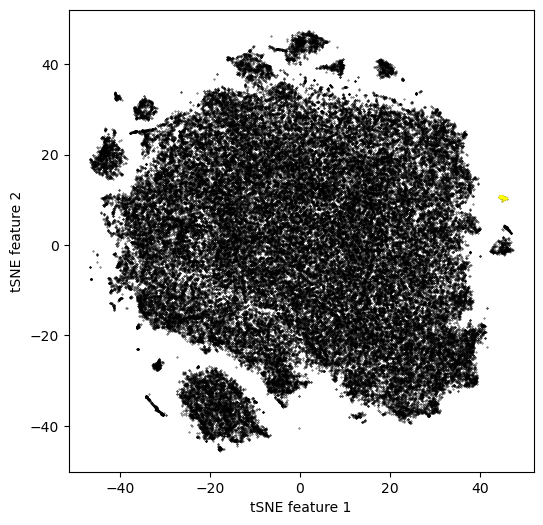

In [44]:
box_size = 2

# box = anomalies[anomalies['obsreg_id']=='17743_278']
box = df_tsne[df_tsne['obsreg_id']=='23022_122'] #'10783_10','10871_10','11059_10','9070_10' distefano = ['13814_567'] NEW = ['23022_122'] glennie = ['12884_10'] jonker = ['803_90'] xue = ['957_208', '3389_274','15211_38'] parmar = ['10783_10','10871_10','11059_10','9070_10'] # LMXB dips!
x0, y0 = box[['tsne1']].values[0][0], box[['tsne2']].values[0][0]
print(x0, y0)
xmin, xmax = x0 - box_size, x0 + box_size
ymin, ymax = y0 - box_size, y0 + box_size
points_in_box = df_tsne[(df_tsne['tsne1'] >= xmin) & (df_tsne['tsne1'] <= xmax) & (df_tsne['tsne2'] >= ymin) & (df_tsne['tsne2'] <= ymax)]
potential_anomalies2 = points_in_box['obsreg_id']
df_properties_anomalies2 = df_properties_global[df_properties_global['obsreg_id'].isin(potential_anomalies2)]

fig, axs = plt.subplots(1, 1, figsize=(6, 6))
plt.rcParams.update({'font.size': 10})
plt.rcParams['font.monospace'] = "Courier"
plt.rcParams["font.family"] = "monospace"
rej = axs.scatter(df_tsne['tsne1'], df_tsne['tsne2'], s=0.1, c='black', label = 'Rejected Clusters')
acc = axs.scatter(points_in_box['tsne1'], points_in_box['tsne2'], s=0.1, c='yellow', label = 'Chosen Clusters')
axs.set_xlabel('tSNE feature 1')
axs.set_ylabel('tSNE feature 2')

In [45]:
# 6. Lightcurve Plotter Function
import astropy 
from astropy import stats as astats
def lightcurveplotterNEW(df_eventfiles_input,id_name,bin_size_sec,hr_window=10,bb_p0 = 0.1,band_errors = True):
    """
    DESCRIPTION: Plots lightcurves and cumulative counts for given eventfile input dataframe
    INPUT: 1. Original eventfile table, 2. Original properties table, 3. Global Path, 4. Set Name
    OUTPUT: 1. Reduced eventfile table, 2. Reduced properties table
    """
    # Define Colour Scheme
    google_blue = '#4285F4'
    google_red = '#DB4437'
    google_yellow = '#F4B400'
    google_green = '#0F9D58'
    google_purple = '#6f2da8'
    # Define Font Settings
    plt.rcParams.update({'font.size': 9})
    plt.rcParams['font.sans-serif'] = 'Helvetica'
    plt.rcParams['font.family'] = 'sans-serif'
    # Create subplots 
    fig, axs = plt.subplots(5, 1, figsize=(6, 12),constrained_layout = True)
    fig.suptitle(f'ObsRegID: {id_name}',fontweight="bold")
    # Prepare df
    df = df_eventfiles_input.copy()
    df['time'] = df_eventfiles_input['time'] - min(df_eventfiles_input['time'])
    df = df.sort_values(by='time') 
    df = df.reset_index(drop=True)
    # Create binned lightcurve
    df_binned = df.groupby(df['time'] // bin_size_sec * bin_size_sec).agg(
        broad_count = ('energy', lambda x: ((x >= 500) & (x <= 7000)).sum()),
        soft_count =('energy', lambda x: ((x >= 500) & (x < 1200)).sum()),
        medium_count=('energy', lambda x: ((x >= 1200) & (x < 2000)).sum()),
        hard_count=('energy', lambda x: ((x >= 2000) & (x <= 7000)).sum()))
    # Plot binned lightcurve
    axs[0].plot(df_binned.index/1000, df_binned['broad_count'], color = google_blue, marker = 'o', markerfacecolor = 'black', markersize = 4)
    axs[0].set_xlabel('Time [ks]')
    axs[0].set_ylabel('Counts per Bin')
    axs[0].set_title(f'Lightcurve with {bin_size_sec}s Bin Size')
    axs[0].set_xlim([0,max(df["time"]/1000)])
    # Create rolling 3-bin averaged lightcurved
    df_rolling = df_binned.rolling(window=3, center=True).mean()
    rolling_std = df_binned.rolling(window=3, center=True).std()
    errors = rolling_std['broad_count']/math.sqrt(3)
    errors.iloc[0] = errors.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors.iloc[-1] = errors.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_h = rolling_std['hard_count']/math.sqrt(3)
    errors_h.iloc[0] = errors_h.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_h.iloc[-1] = errors_h.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_m = rolling_std['medium_count']/math.sqrt(3)
    errors_m.iloc[0] = errors_m.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_m.iloc[-1] = errors_m.iloc[-1] * math.sqrt(3)/math.sqrt(2)

    errors_s = rolling_std['soft_count']/math.sqrt(3)
    errors_s.iloc[0] = errors_s.iloc[0] * math.sqrt(3)/math.sqrt(2)
    errors_s.iloc[-1] = errors_s.iloc[-1] * math.sqrt(3)/math.sqrt(2)
    # Plot rolling 3-bin averaged lightcurved
    axs[1].plot(df_rolling.index/1000, df_rolling['broad_count'], color = google_red)
    axs[1].errorbar(df_rolling.index/1000, df_rolling['broad_count'], yerr = errors, xerr = None,fmt ='.',color = "black",linewidth = .5,capsize = 1)
    axs[1].set_xlabel('Time [ks]')
    axs[1].set_ylabel('Counts per Bin')
    axs[1].set_title('Running Average of 3 Bins')
    axs[1].set_xlim([0,max(df["time"]/1000)])
    # Create cumulative count plot
    df_cumulative = df.copy()
    df_cumulative['count'] = 1
    df_cumulative['cumulative_count'] = df_cumulative['count'].cumsum()
    # Create a BB plot
    bb_bins = astats.bayesian_blocks(df['time'].values/1000, fitness='events',p0 = bb_p0) # p0 = 0.01 or so BASED ON VINAY ! 6?
    bin_widths = bb_bins[1:] - bb_bins[:-1]
    counts, bins =  np.histogram(df['time']/1000, bins=bb_bins)
    countrate = counts/bin_widths 
    bin_centers = (bb_bins[:-1] + bb_bins[1:]) / 2
    axs[3].step(bb_bins, np.append(countrate, countrate[-1]), where='post', color='black')
    axs[3].set_xlim([0,max(df["time"]/1000)])
    # axs[3].set_xlim(axs[1].get_xlim())
    axs[3].set_xlabel('Time [ks]')
    axs[3].set_ylabel('Count Rate')
    axs[3].set_title(f'Bayesian Blocks Count Rate (p0 = {bb_p0})')
    # Create a Energy Band Plot
    axs[2].plot(df_rolling.index/1000, df_rolling['hard_count'], color = google_blue, label='Hard')
    axs[2].plot(df_rolling.index/1000, df_rolling['medium_count'], color = google_green, label='Medium')
    axs[2].plot(df_rolling.index/1000, df_rolling['soft_count'], color = google_red, label='Soft')
    if band_errors == True:
        axs[2].errorbar(df_rolling.index/1000, df_rolling['hard_count'], yerr = errors_h, xerr = None,fmt ='.',color = google_blue,linewidth = 1,capsize = 2)
        axs[2].errorbar(df_rolling.index/1000, df_rolling['medium_count'], yerr = errors_m, xerr = None,fmt ='.',color = google_green,linewidth = 1,capsize = 2)
        axs[2].errorbar(df_rolling.index/1000, df_rolling['soft_count'], yerr = errors_s, xerr = None,fmt ='.',color = google_red,linewidth = 1,capsize = 2)
    axs[2].set_xlim([0,max(df_binned.index/1000)])
    # axs[3].set_ylim([0,np.max([df_binned['hard_count'],df_binned['medium_count'],df_binned['soft_count']])*1.3])
    axs[2].set_ylabel('Counts')
    axs[2].set_xlabel('Time [ks]')
    axs[2].set_title(f'Energy Bands with {bin_size_sec}s Bin Size - Running Avg')
    axs[2].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False)

    # # Create HR 
    # # Compute the counts for each energy band
    # df['soft_count'] = ((df['energy'] >= 500) & (df['energy'] < 1200)).rolling(hr_window).sum()
    # df['medium_count'] = ((df['energy'] >= 1200) & (df['energy'] < 2000)).rolling(hr_window).sum()
    # df['hard_count'] = ((df['energy'] >= 2000) & (df['energy'] <= 7000)).rolling(hr_window).sum()
    # df[['soft_count', 'medium_count','hard_count']] = df[['soft_count', 'medium_count','hard_count']].shift(-math.floor(hr_window/2))
    # # Compute the HR ratios using the counts
    # df['HR_hs'] = (df['hard_count'] - df['soft_count']) / (df['hard_count'] + df['soft_count'])
    # df['HR_hm'] = (df['hard_count'] - df['medium_count']) / (df['hard_count'] + df['medium_count'])
    # df['HR_ms'] = (df['medium_count'] - df['soft_count']) / (df['medium_count'] + df['soft_count'])

    # axs[4].plot(df["time"]/1000, df['HR_hs'], color = google_blue, label='H-S')
    # axs[4].plot(df["time"]/1000, df['HR_hm'], color = google_green, label='H-M')
    # axs[4].plot(df["time"]/1000, df['HR_ms'], color = google_red, label='M-S')
    # axs[4].set_xlim([0,max(df["time"]/1000)])
    # # axs[3].set_ylim([0,np.max([df_binned['hard_count'],df_binned['medium_count'],df_binned['soft_count']])*1.3])
    # axs[4].set_ylabel('HR')
    # axs[4].set_xlabel('Time [ks]')
    # axs[4].set_title(f'Running HR over {hr_window} counts')
    # axs[4].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False)

    #Create BB HR
    df_hr_bb = df.copy()
    # compute photon counts in each bin
    df_hr_bb = df_hr_bb.groupby(pd.cut(df_hr_bb['time']/1000, bb_bins)).agg(
        hard_count=('energy', lambda x: ((x >= 2000) & (x <= 7000)).sum()),
        medium_count=('energy', lambda x: ((x >= 1200) & (x < 2000)).sum()),
        soft_count=('energy', lambda x: ((x >= 500) & (x < 1200)).sum())
    )
    df_hr_bb["bb_hs"] = (df_hr_bb['hard_count'] - df_hr_bb['soft_count']) / (df_hr_bb['hard_count'] + df_hr_bb['soft_count'])
    df_hr_bb["bb_hm"]  = (df_hr_bb['hard_count'] - df_hr_bb['medium_count']) / (df_hr_bb['hard_count'] + df_hr_bb['medium_count'])
    df_hr_bb["bb_ms"]  = (df_hr_bb['medium_count'] - df_hr_bb['soft_count']) / (df_hr_bb['medium_count'] + df_hr_bb['soft_count'])
    bb_hs = df_hr_bb["bb_hs"].values
    bb_hm = df_hr_bb["bb_hm"].values
    bb_ms = df_hr_bb["bb_ms"].values
    axs[4].step(bb_bins, np.append(bb_hs, bb_hs[-1]), where='post',color = google_blue, label='H-S')
    axs[4].step(bb_bins, np.append(bb_hm, bb_hm[-1]), where='post',color = google_green, label='H-M')
    axs[4].step(bb_bins, np.append(bb_ms, bb_ms[-1]), where='post',color = google_red, label='M-S')
    axs[4].set_xlim([0,max(df["time"]/1000)])
    # axs[5].set_xlim(axs[1].get_xlim())
    axs[4].set_ylabel('HR')
    axs[4].set_xlabel('Time [ks]')
    axs[4].set_title(f'Bayesian Blocks HR')
    axs[4].legend(loc='upper center', bbox_to_anchor=(0.5, 1.05),ncol=3, frameon = False)
    plt.show()
    return countrate 

108
Name: 2CXO J030926.9-203637, ID: 10798-38, Date: 2008-11-05T23:14:09, Counts: 11
RA  47.362472883155306 DEC  -20.610549761158527
varB  0.56 varH  0.31 varM  0.43 varS  0.85 varINDEX  1.0


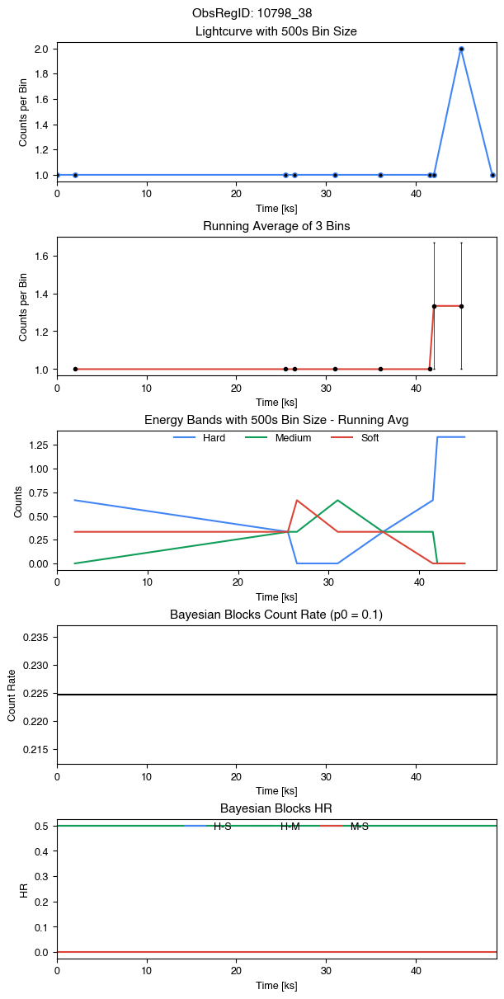

Name: 2CXO J180026.0-240506, ID: 10997-17, Date: 2010-07-30T23:46:06, Counts: 45
RA  270.1083969909853 DEC  -24.085045300501
varB  1.0 varH  1.0 varM  0.8 varS  nan varINDEX  9.0


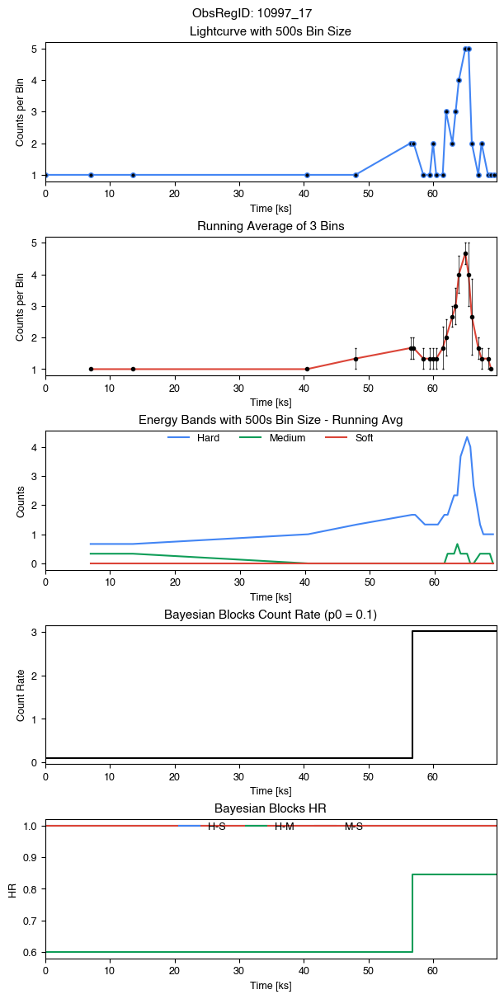

Name: 2CXO J111512.8-610853, ID: 12330-1919, Date: 2010-10-18T07:14:08, Counts: 51
RA  168.80348083342096 DEC  -61.14811877888479
varB  0.99 varH  1.0 varM  nan varS  nan varINDEX  6.0


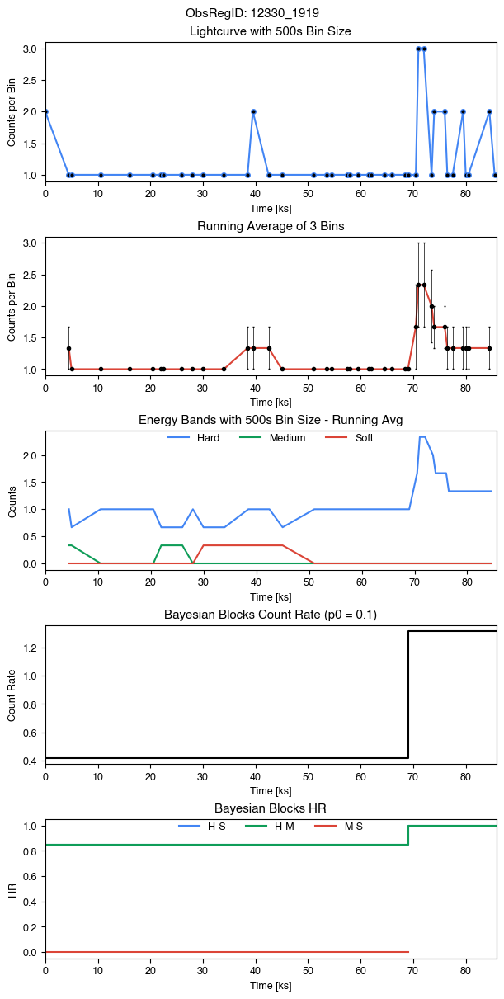

Name: 2CXO J181814.3-165247, ID: 12348-114, Date: 2011-07-30T15:17:01, Counts: 29
RA  274.5597376986718 DEC  -16.879890163056192
varB  1.0 varH  1.0 varM  0.49 varS  nan varINDEX  8.0


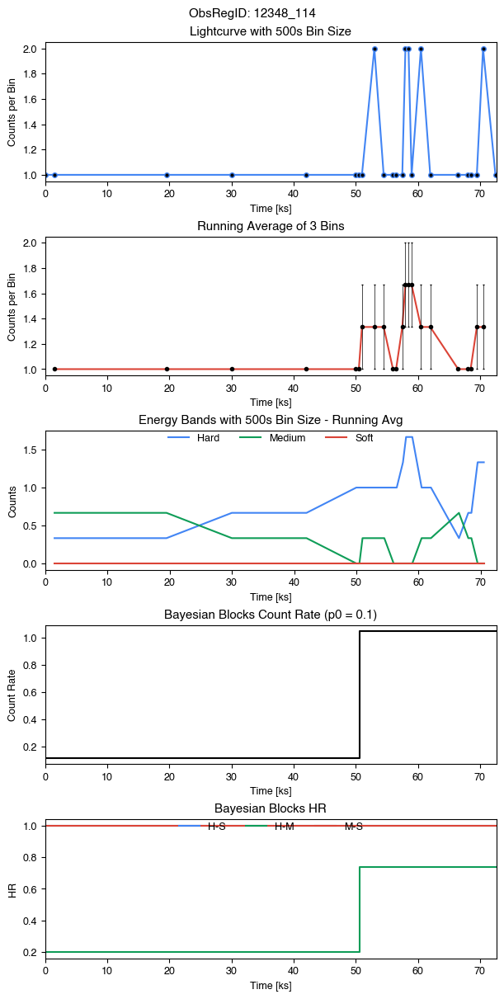

Name: 2CXO J181805.1-164816, ID: 12348-399, Date: 2011-07-30T15:17:01, Counts: 79
RA  274.5214113221207 DEC  -16.804439542084836
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  10.0


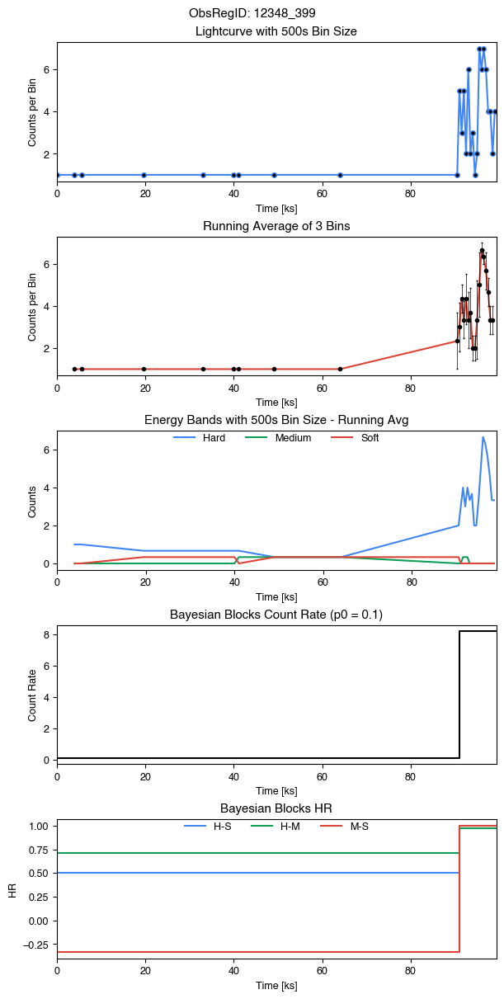

Name: 2CXO J171903.9-360634, ID: 13436-137, Date: 2011-07-13T09:56:49, Counts: 110
RA  259.7664029209501 DEC  -36.10972570446024
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


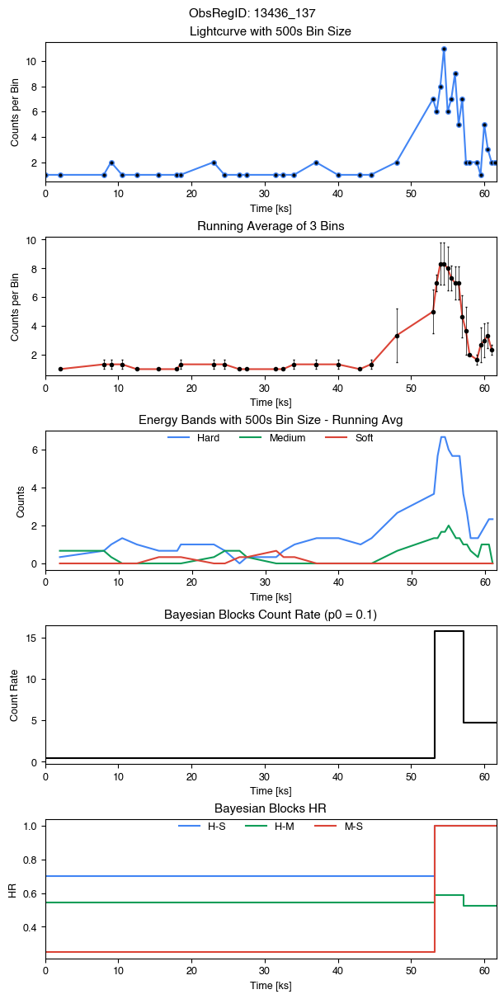

Name: 2CXO J171958.7-361015, ID: 13436-38, Date: 2011-07-13T09:56:49, Counts: 154
RA  259.9948652936512 DEC  -36.1709750681794
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


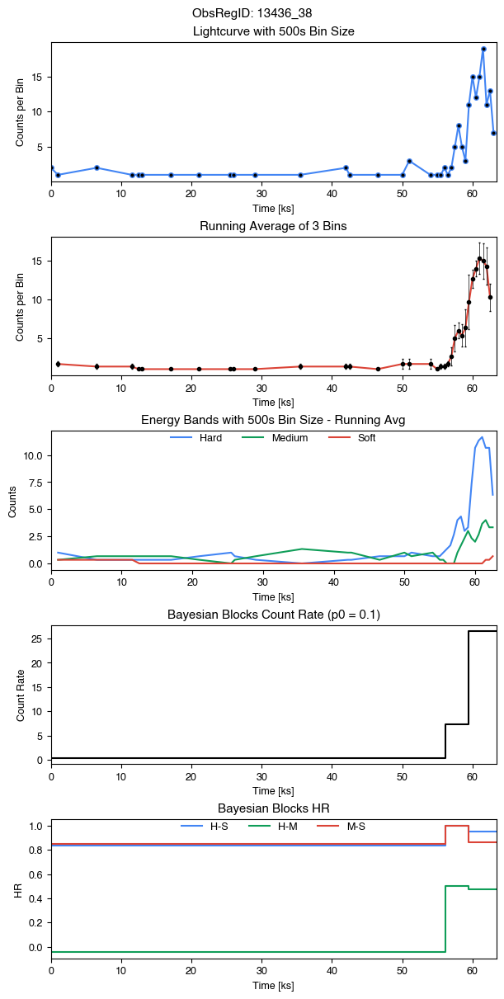

Name: 2CXO J064111.8+093743, ID: 13610-244, Date: 2011-12-05T02:11:58, Counts: 152
RA  100.2995591948947 DEC  9.62879967805054
varB  1.0 varH  1.0 varM  0.99 varS  nan varINDEX  10.0


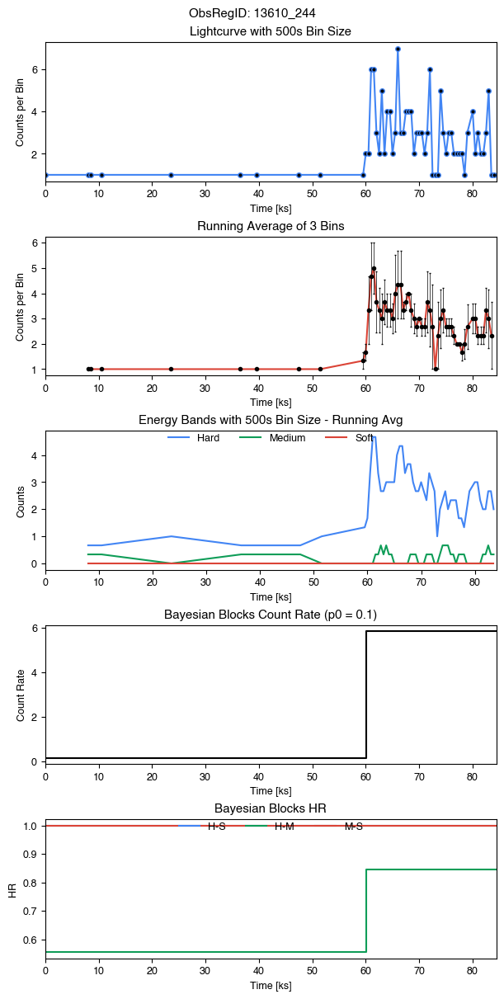

Name: 2CXO J064104.5+093618, ID: 13610-396, Date: 2011-12-05T02:11:58, Counts: 36
RA  100.26924427067875 DEC  9.60503187165614
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  8.0


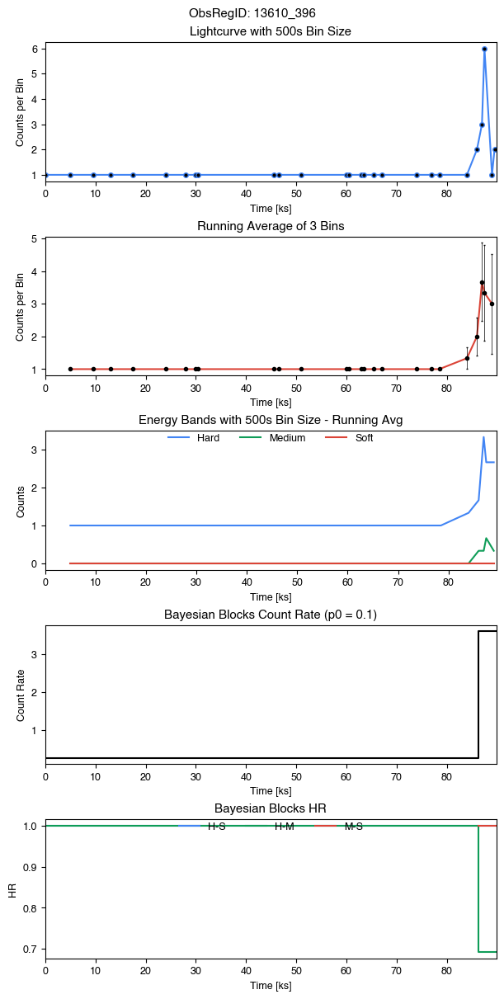

Name: 2CXO J064039.0+093315, ID: 13611-110, Date: 2011-12-07T10:59:49, Counts: 33
RA  100.16294912977293 DEC  9.55435824022348
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  8.0


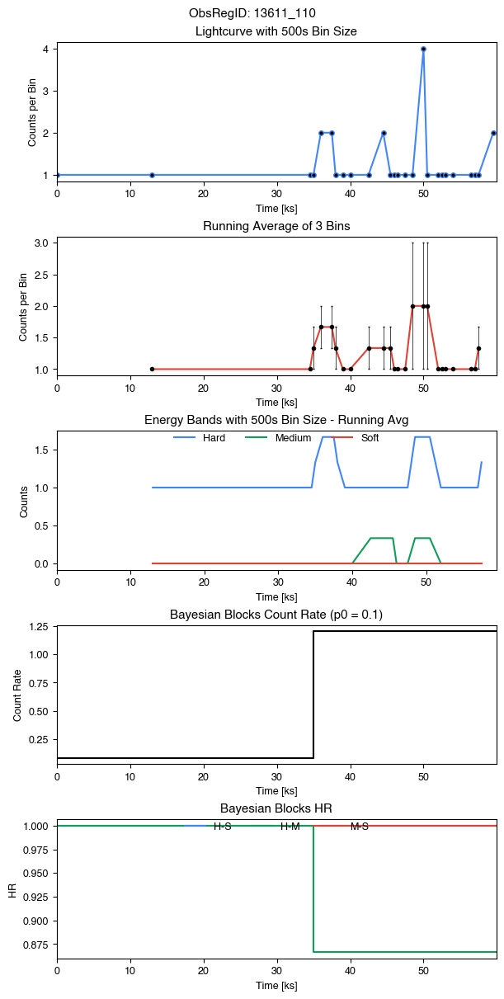

Name: 2CXO J053519.8-052221, ID: 13637-612, Date: 2012-10-02T07:23:02, Counts: 80
RA  83.83258653506743 DEC  -5.372658426185705
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  9.0


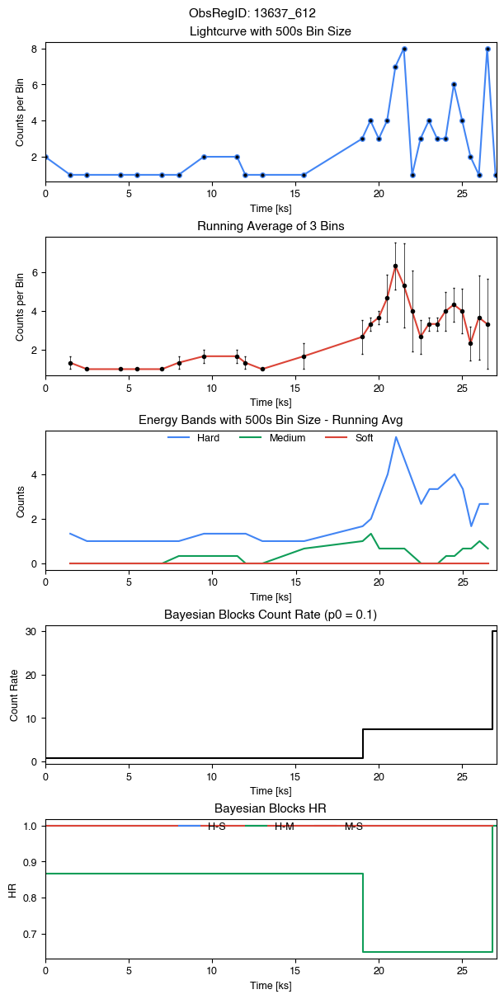

Name: 2CXO J205702.2+434827, ID: 13648-39, Date: 2011-12-26T21:01:27, Counts: 63
RA  314.2594623257462 DEC  43.8074096102396
varB  1.0 varH  1.0 varM  0.48 varS  nan varINDEX  8.0


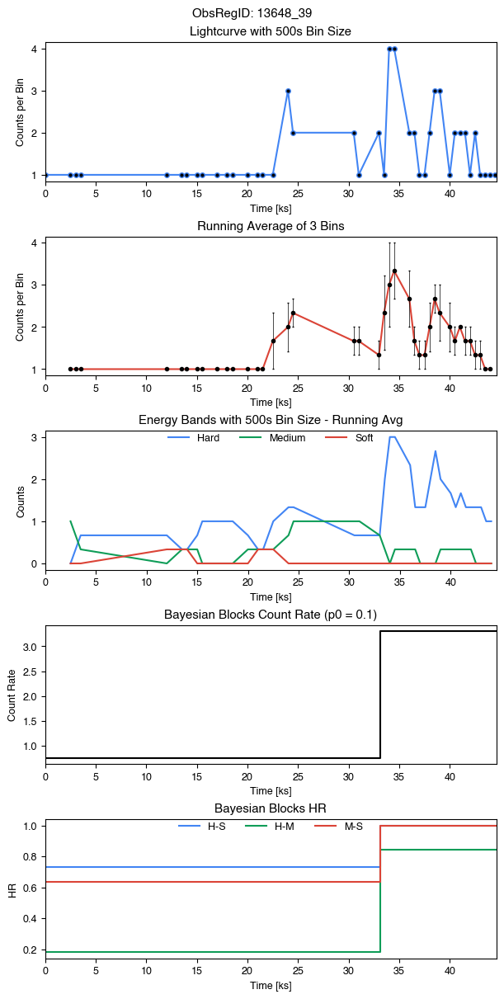

Name: 2CXO J155431.4-550031, ID: 13768-416, Date: 2012-05-22T00:49:14, Counts: 52
RA  238.63081805378056 DEC  -55.008881107625875
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


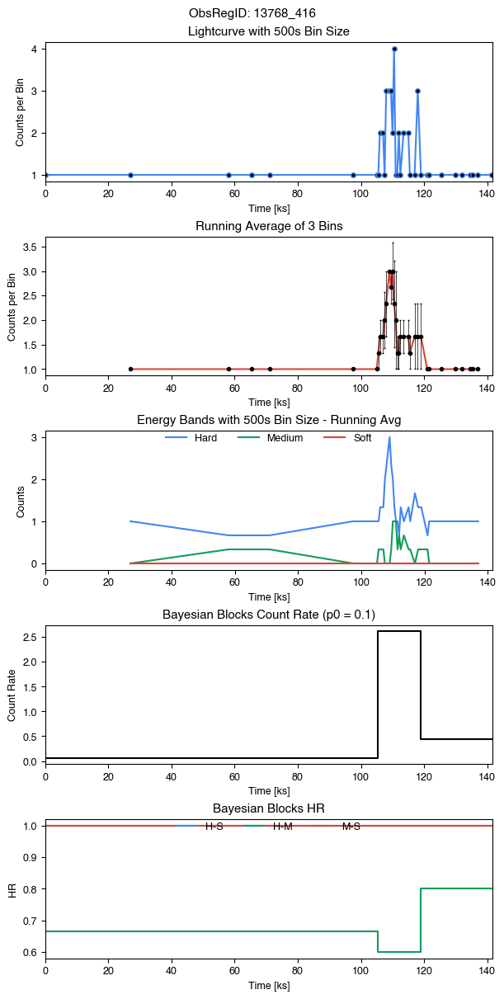

Name: 2CXO J064107.6+093419, ID: 14368-389, Date: 2011-12-03T01:41:36, Counts: 72
RA  100.28193891820833 DEC  9.571960559852185
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


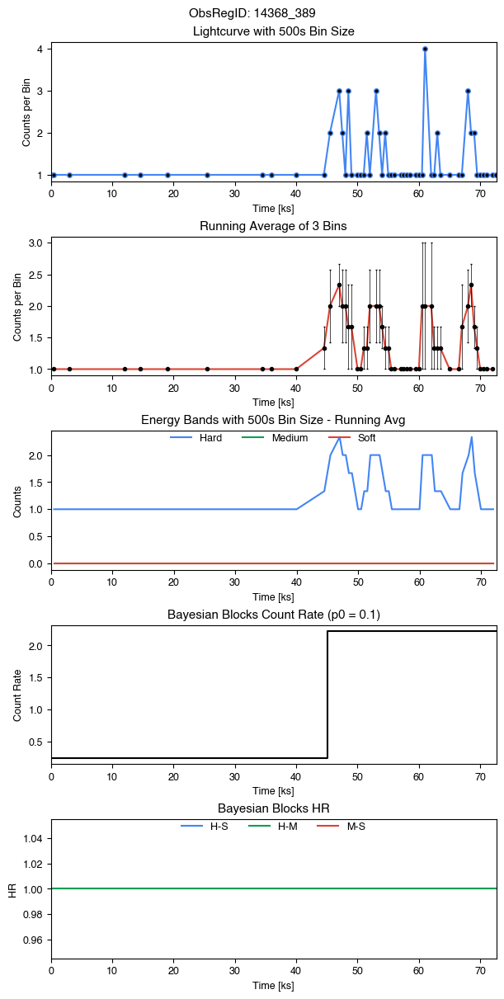

Name: 2CXO J162112.4-504114, ID: 14531-179, Date: 2013-06-25T02:02:38, Counts: 25
RA  245.302037463096 DEC  -50.6875595209634
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


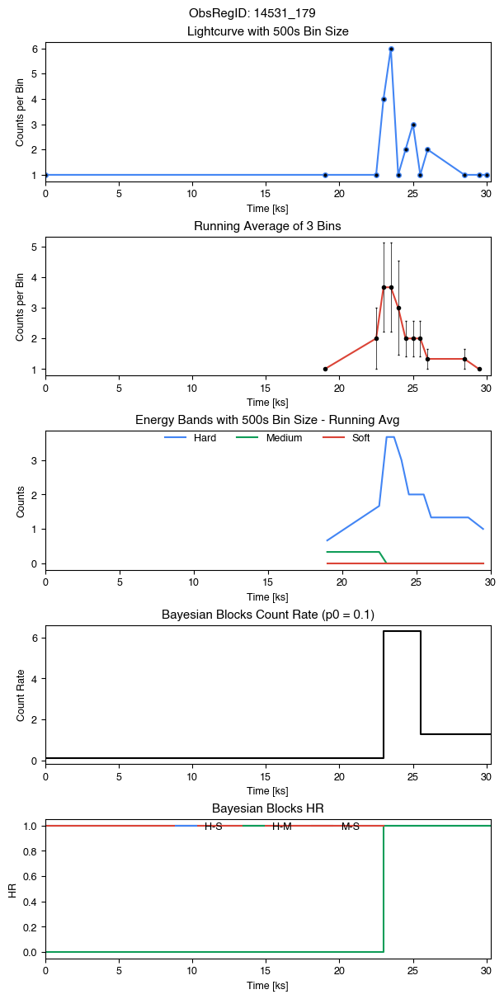

Name: 2CXO J000212.9+672558, ID: 14536-152, Date: 2014-01-14T18:15:34, Counts: 201
RA  0.5538343838464357 DEC  67.43290698864746
varB  1.0 varH  1.0 varM  1.0 varS  0.61 varINDEX  10.0


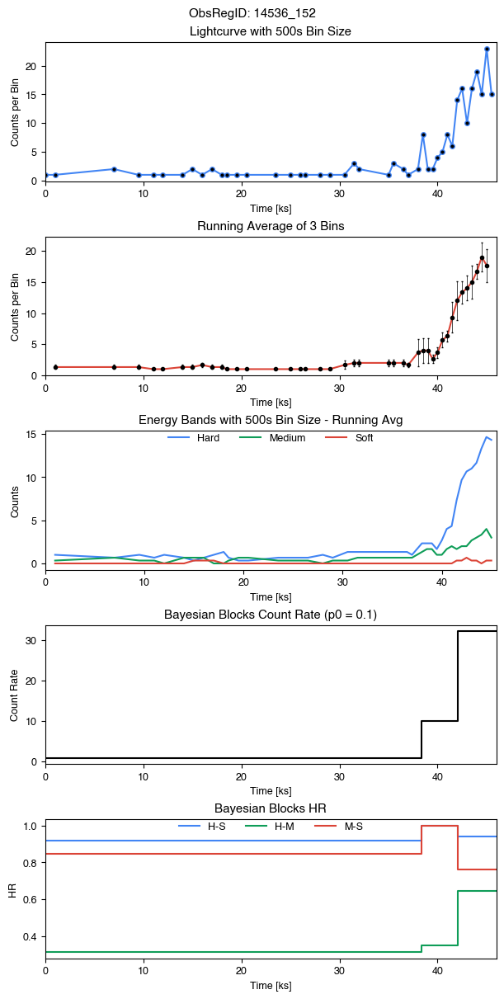

Name: 2CXO J053514.3-052317, ID: 1522-3128, Date: 2000-04-01T17:48:45, Counts: 156
RA  83.80971388219518 DEC  -5.388176898962816
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


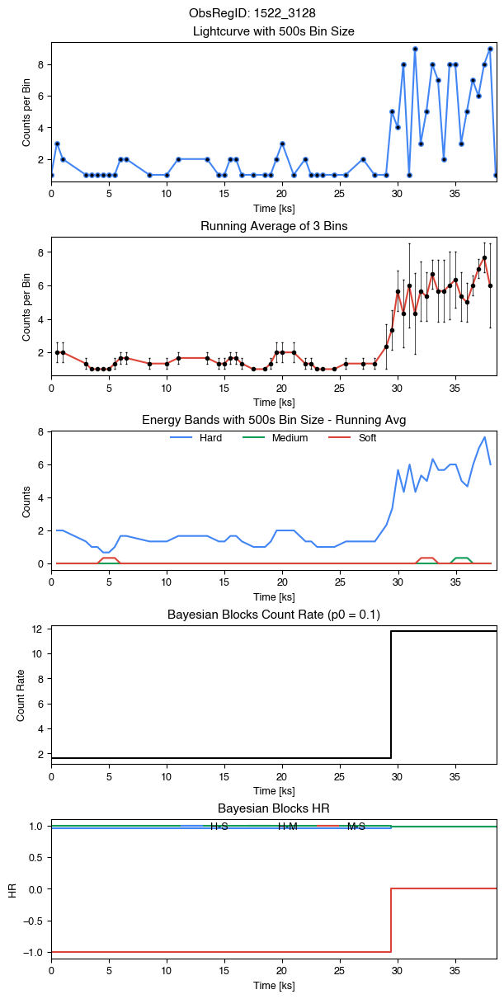

Name: 2CXO J043136.1+181343, ID: 1866-51, Date: 2001-07-23T05:30:36, Counts: 53
RA  67.90063600462213 DEC  18.228616937996637
varB  1.0 varH  1.0 varM  0.47 varS  nan varINDEX  7.0


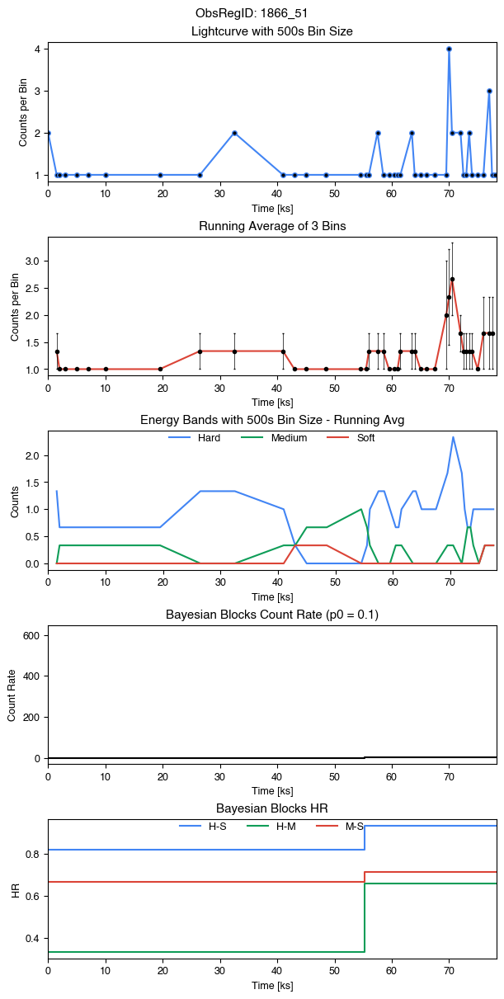

Name: 2CXO J054147.4-015526, ID: 1878-277, Date: 2001-08-08T07:02:51, Counts: 805
RA  85.44773794704685 DEC  -1.924015777600946
varB  1.0 varH  1.0 varM  1.0 varS  0.85 varINDEX  10.0


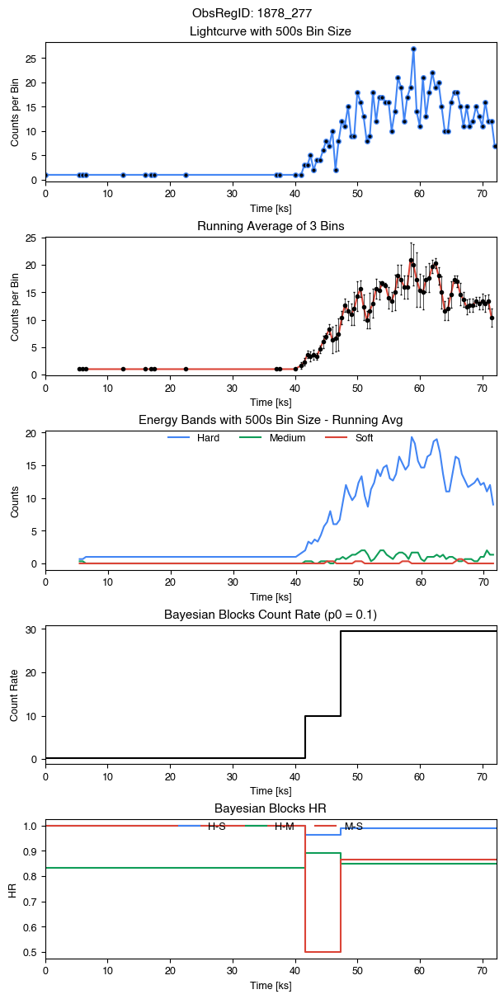

Name: 2CXO J054146.1-015415, ID: 1878-290, Date: 2001-08-08T07:02:51, Counts: 1478
RA  85.44218754569079 DEC  -1.9041421919996688
varB  1.0 varH  1.0 varM  1.0 varS  0.97 varINDEX  10.0


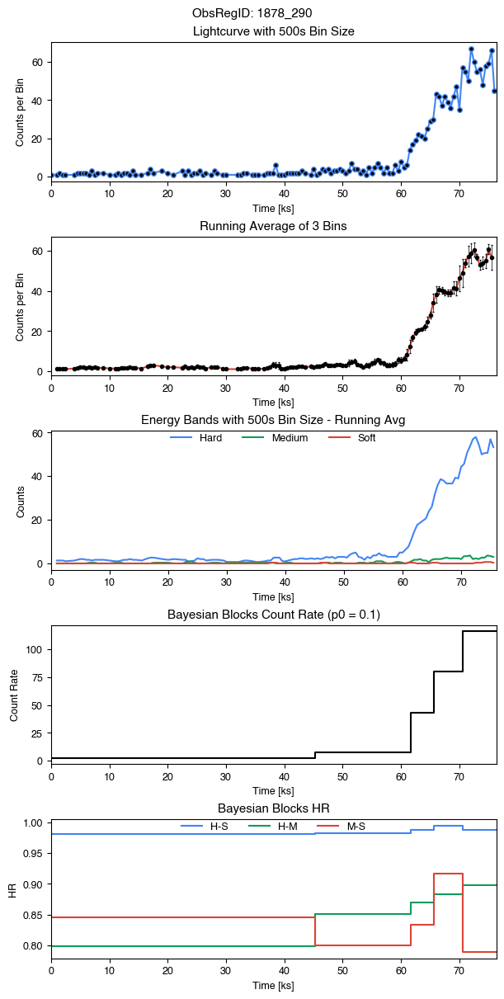

Name: 2CXO J054126.9-015409, ID: 1878-293, Date: 2001-08-08T07:02:51, Counts: 275
RA  85.36232655756618 DEC  -1.9025673873992972
varB  1.0 varH  1.0 varM  0.65 varS  nan varINDEX  10.0


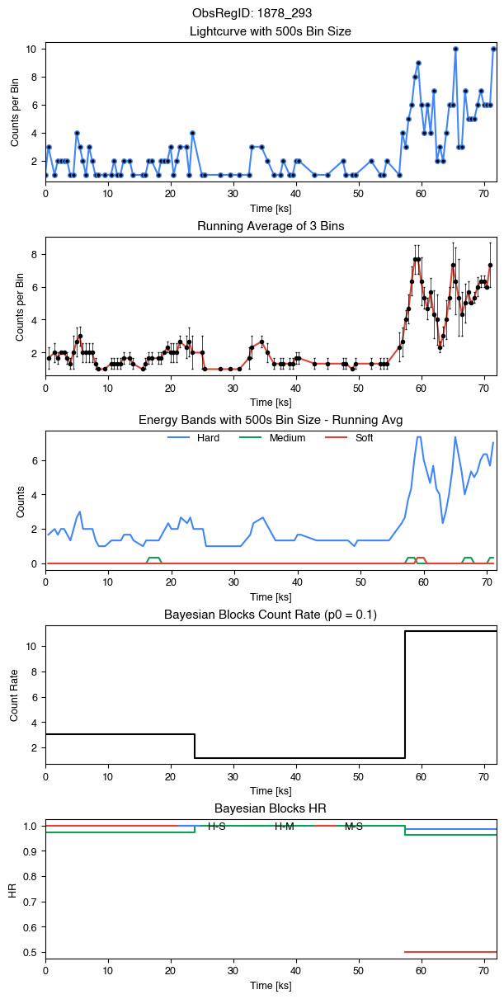

Name: 2CXO J054145.0-015406, ID: 1878-294, Date: 2001-08-08T07:02:51, Counts: 541
RA  85.43778021521035 DEC  -1.9017901885243695
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


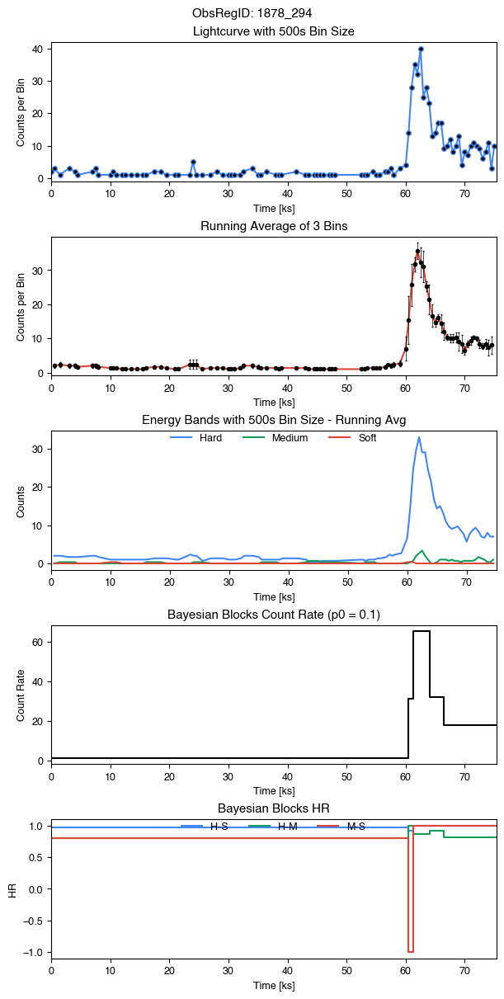

Name: 2CXO J054139.0-015626, ID: 1878-44, Date: 2001-08-08T07:02:51, Counts: 188
RA  85.41277446220465 DEC  -1.9407336249004443
varB  1.0 varH  1.0 varM  0.49 varS  nan varINDEX  9.0


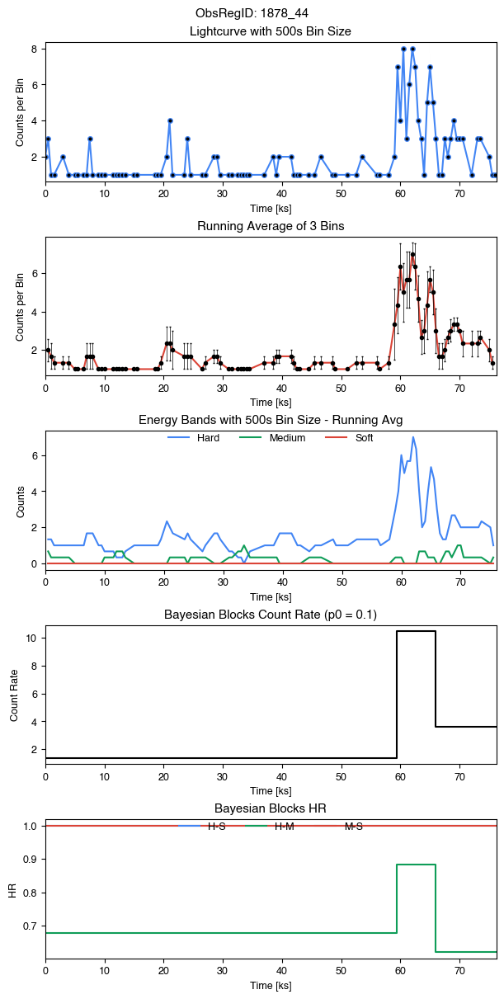

Name: 2CXO J060747.5-062245, ID: 1882-411, Date: 2000-12-02T23:31:06, Counts: 73
RA  91.94838897282756 DEC  -6.37926838138375
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


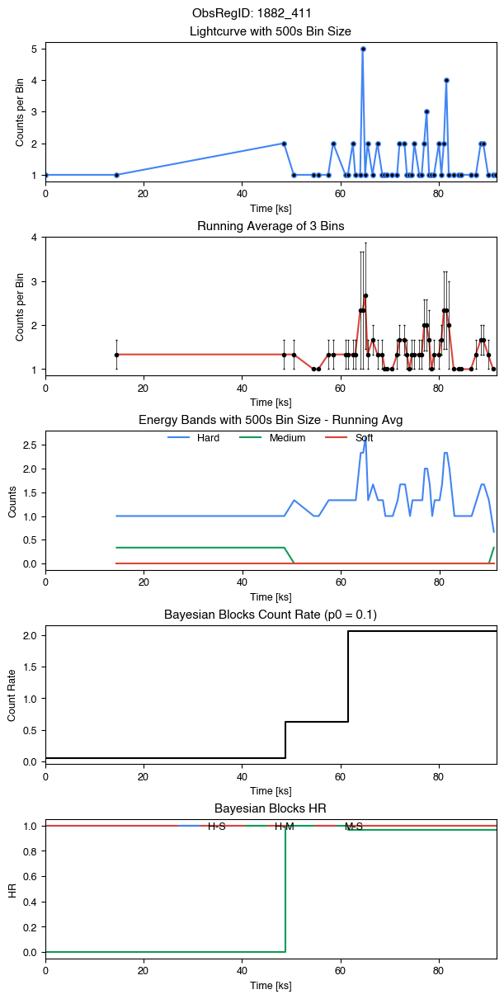

Name: 2CXO J060745.9-062457, ID: 1882-57, Date: 2000-12-02T23:31:06, Counts: 292
RA  91.94131146922903 DEC  -6.416027760467609
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


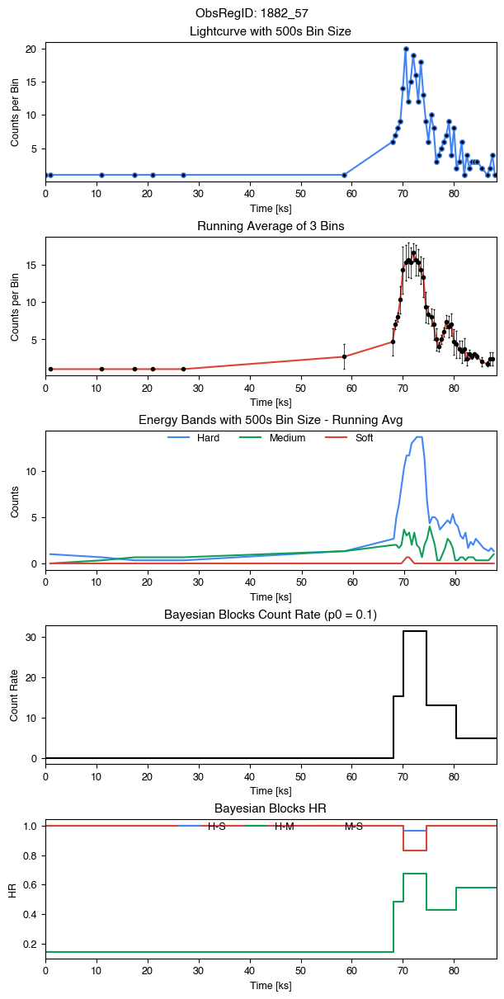

Name: 2CXO J085859.9-473109, ID: 2556-116, Date: 2001-12-10T10:31:29, Counts: 106
RA  134.74972442974558 DEC  -47.51887892833141
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  10.0


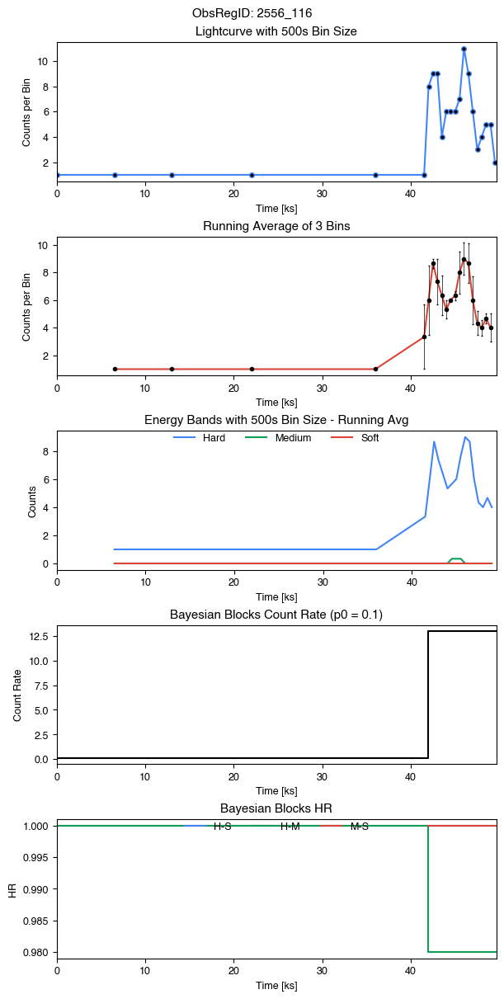

Name: 2CXO J085905.8-473036, ID: 2556-545, Date: 2001-12-10T10:31:29, Counts: 167
RA  134.77437591909552 DEC  -47.510136959175725
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


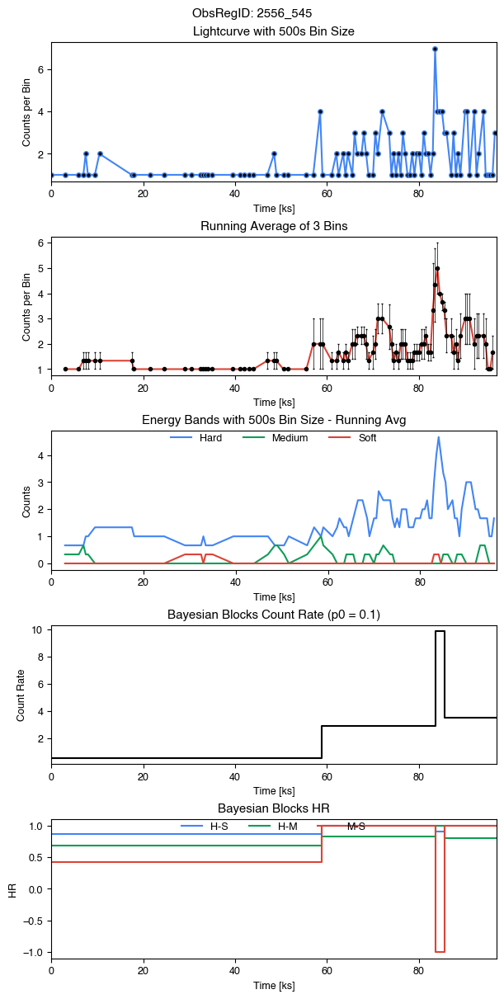

Name: 2CXO J085906.6-473018, ID: 2556-554, Date: 2001-12-10T10:31:29, Counts: 56
RA  134.7776124951189 DEC  -47.505092948371086
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  8.0


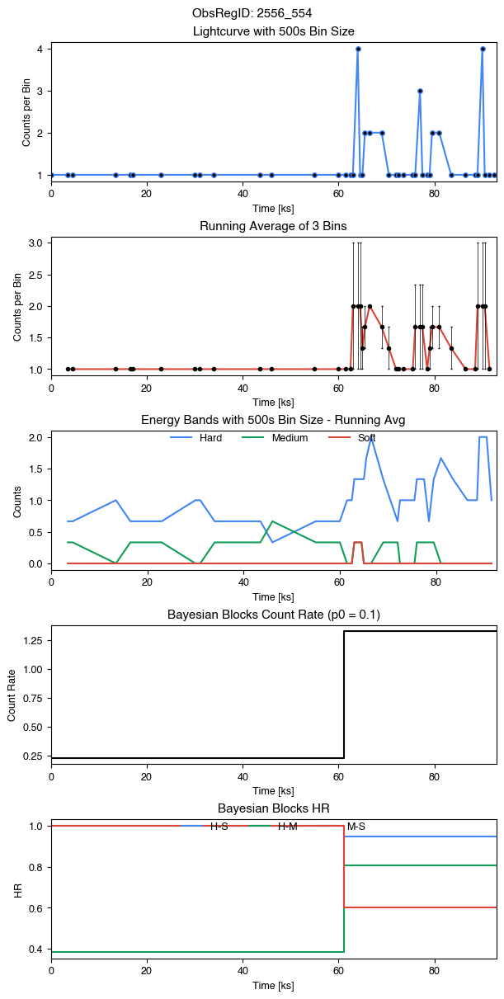

Name: 2CXO J053511.8-052100, ID: 3498-1436, Date: 2003-01-21T06:26:35, Counts: 319
RA  83.79937485092455 DEC  -5.350068556306376
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


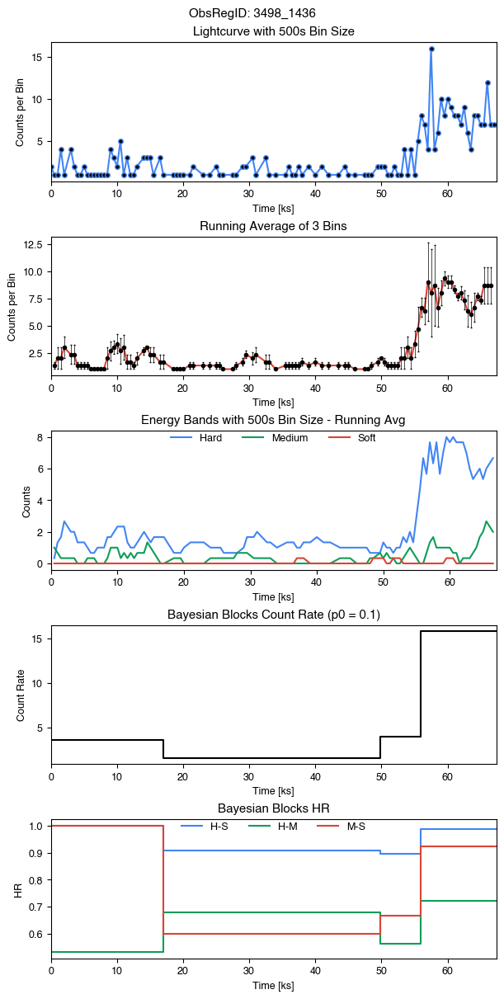

Name: 2CXO J053511.7-052333, ID: 3498-3122, Date: 2003-01-21T06:26:35, Counts: 64
RA  83.79889027133828 DEC  -5.392669841083591
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


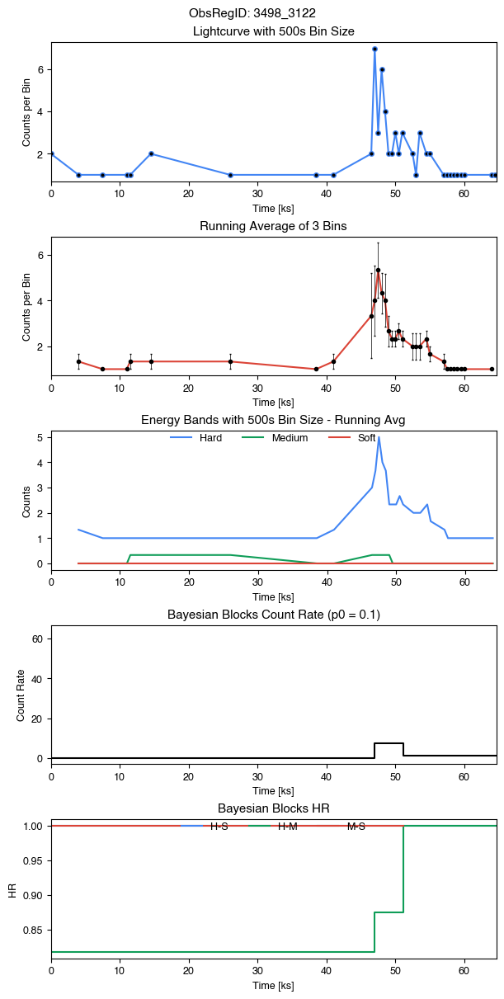

Name: 2CXO J053515.2-052155, ID: 3498-3283, Date: 2003-01-21T06:26:35, Counts: 49
RA  83.81360278417702 DEC  -5.3654612477171355
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  10.0


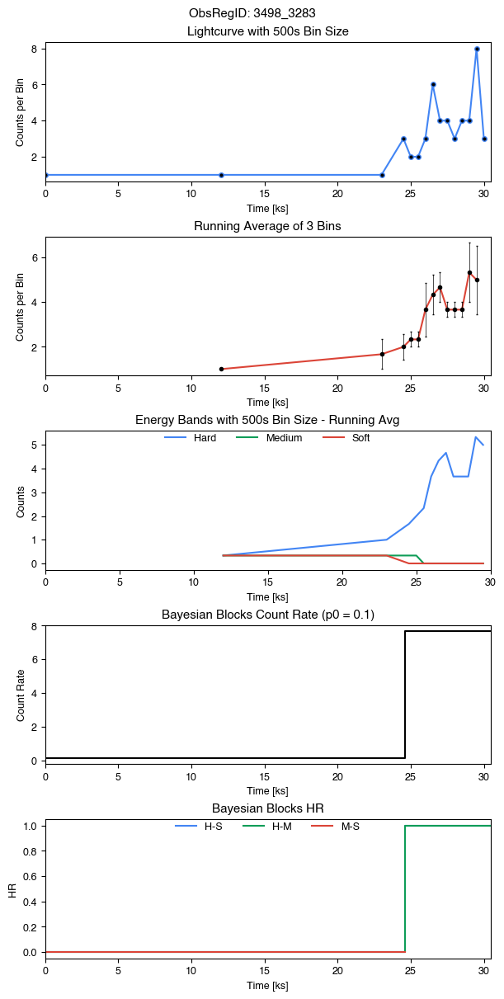

Name: 2CXO J053521.7-051946, ID: 3498-875, Date: 2003-01-21T06:26:35, Counts: 328
RA  83.84059469875308 DEC  -5.329528228743617
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


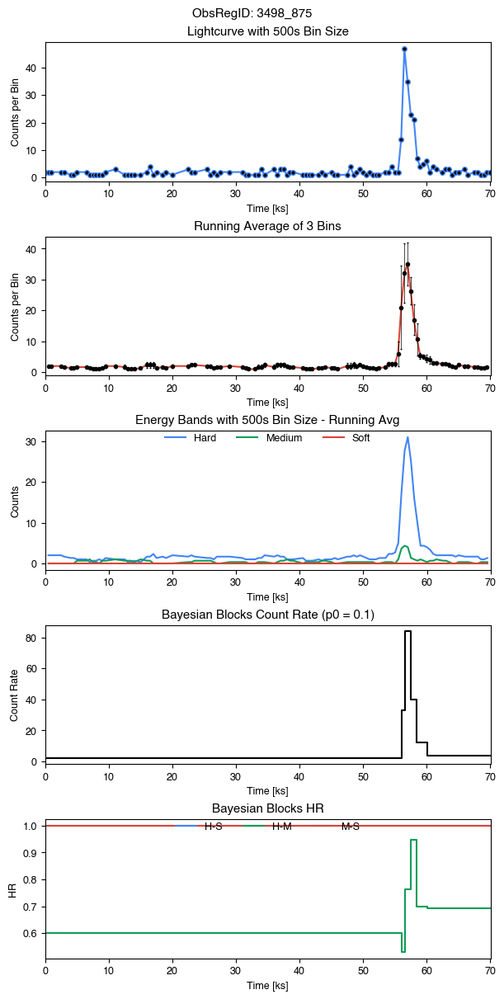

Name: 2CXO J053519.1-052112, ID: 3744-1430, Date: 2003-01-10T16:33:58, Counts: 40
RA  83.82969836949457 DEC  -5.353486317146336
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  8.0


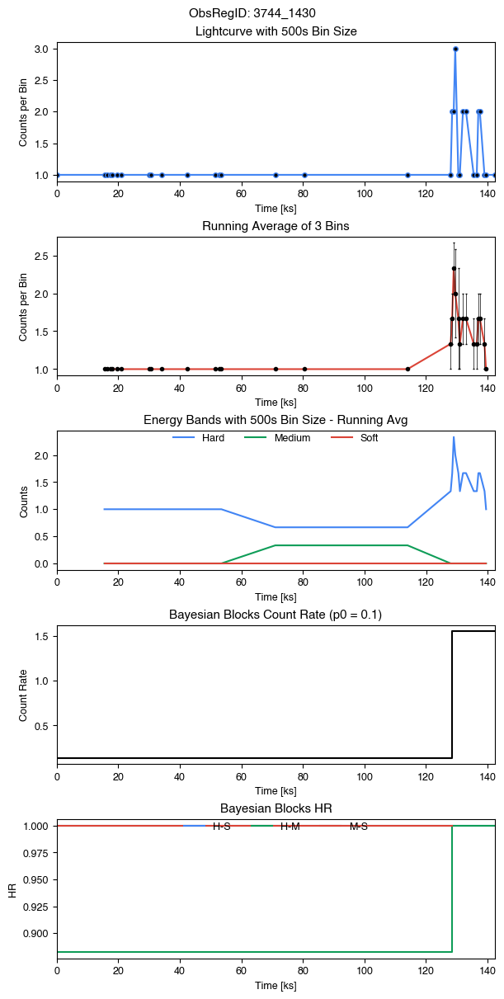

Name: 2CXO J053524.6-052104, ID: 3744-1435, Date: 2003-01-10T16:33:58, Counts: 63
RA  83.85258498862396 DEC  -5.351198020050868
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


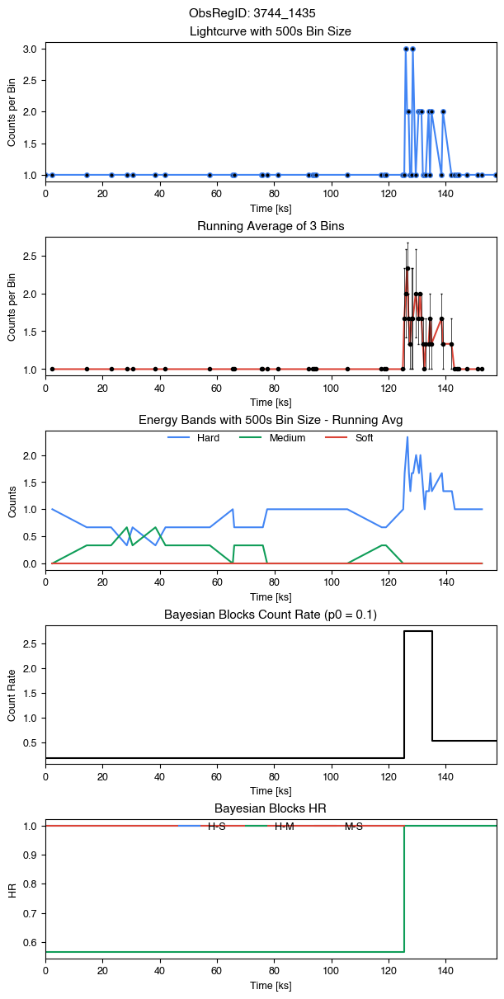

Name: 2CXO J053514.0-052012, ID: 3744-1457, Date: 2003-01-10T16:33:58, Counts: 87
RA  83.80850336925573 DEC  -5.336815995141675
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


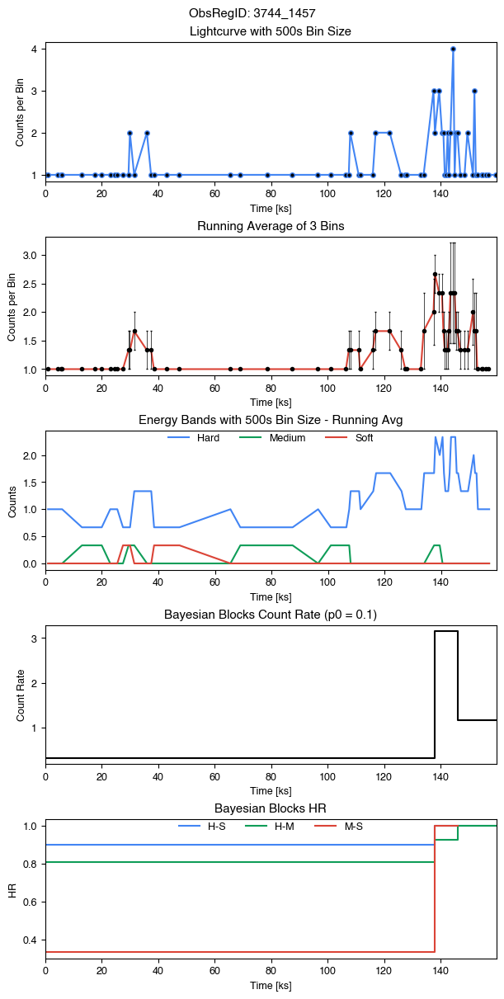

Name: 2CXO J053517.4-052251, ID: 3744-3143, Date: 2003-01-10T16:33:58, Counts: 123
RA  83.82283226032689 DEC  -5.3809067556635295
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  10.0


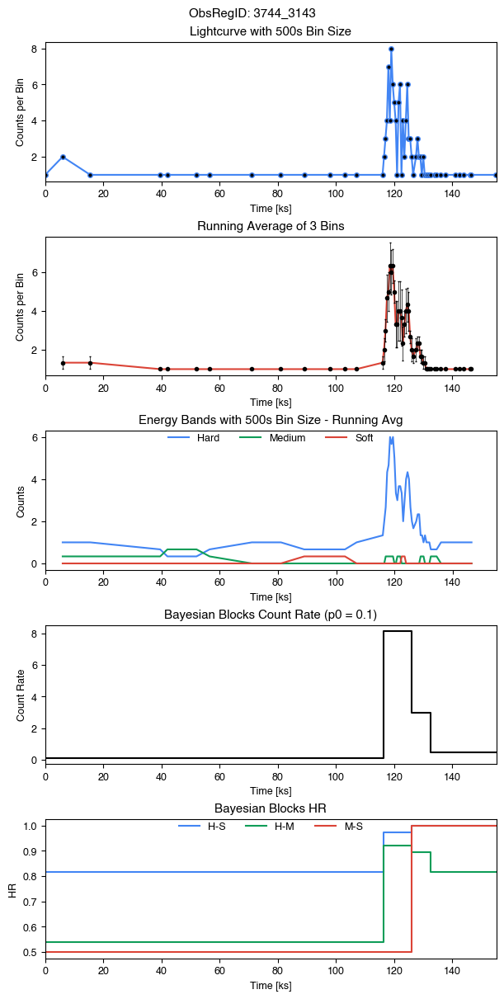

Name: 2CXO J053510.4-052149, ID: 3744-3252, Date: 2003-01-10T16:33:58, Counts: 205
RA  83.79358302652832 DEC  -5.363752305415312
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


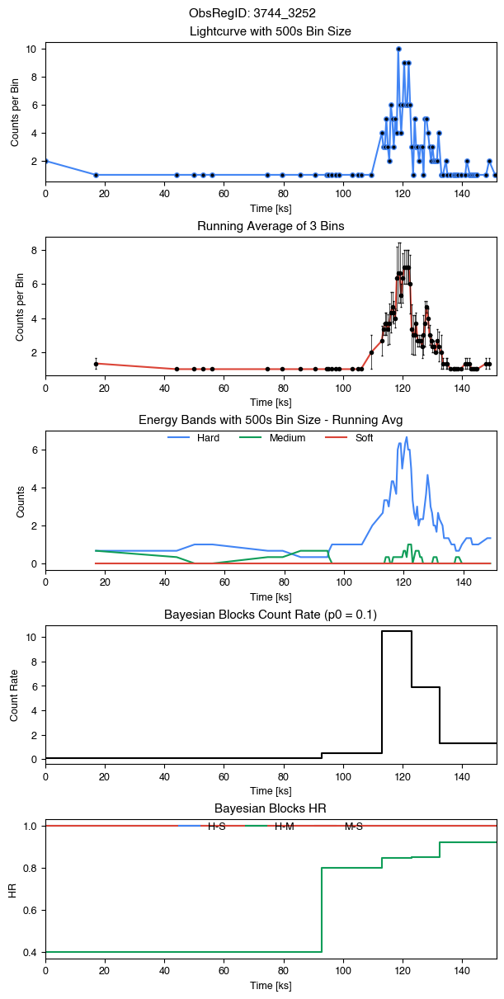

Name: 2CXO J053516.2-052210, ID: 3744-3289, Date: 2003-01-10T16:33:58, Counts: 1148
RA  83.81780932245636 DEC  -5.369575660001801
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


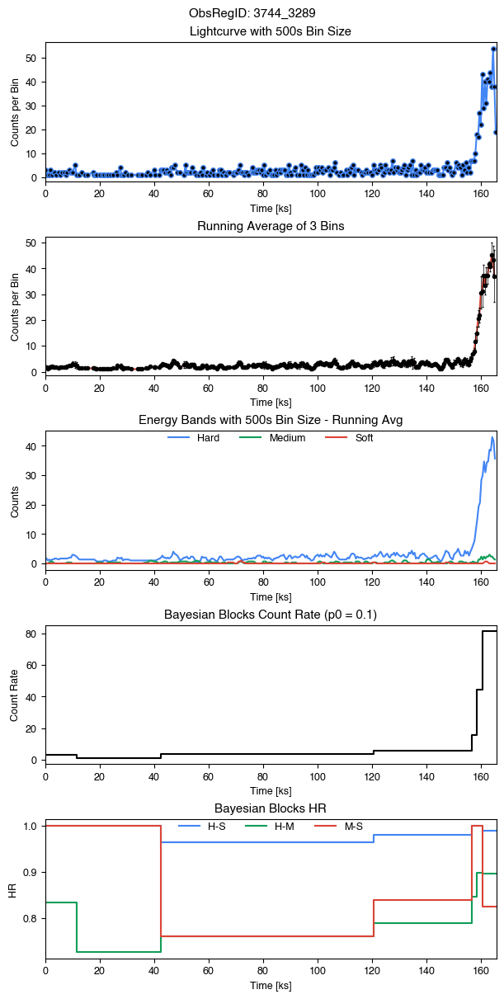

Name: 2CXO J053515.1-052229, ID: 3744-3294, Date: 2003-01-10T16:33:58, Counts: 74
RA  83.81323915367977 DEC  -5.374899841657444
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


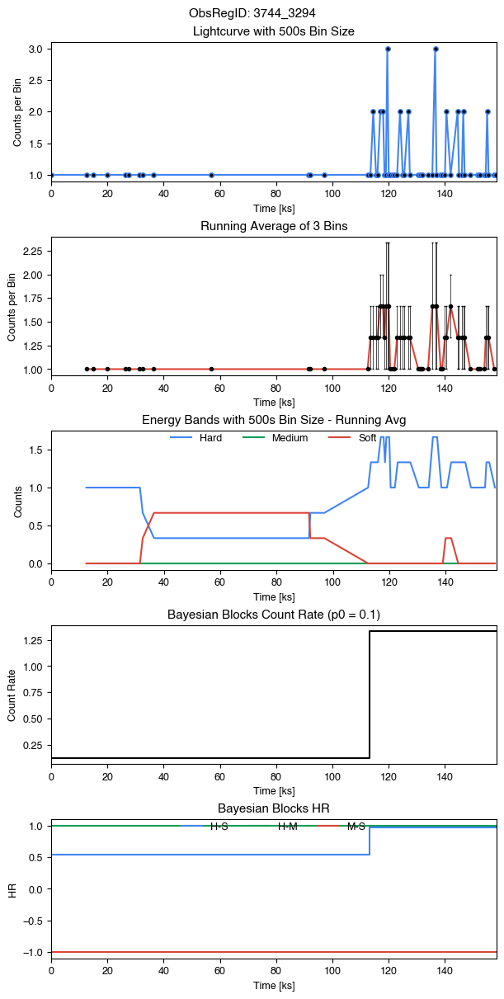

Name: 2CXO J053519.6-051929, ID: 3744-897, Date: 2003-01-10T16:33:58, Counts: 94
RA  83.83208114428203 DEC  -5.325024165364123
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  10.0


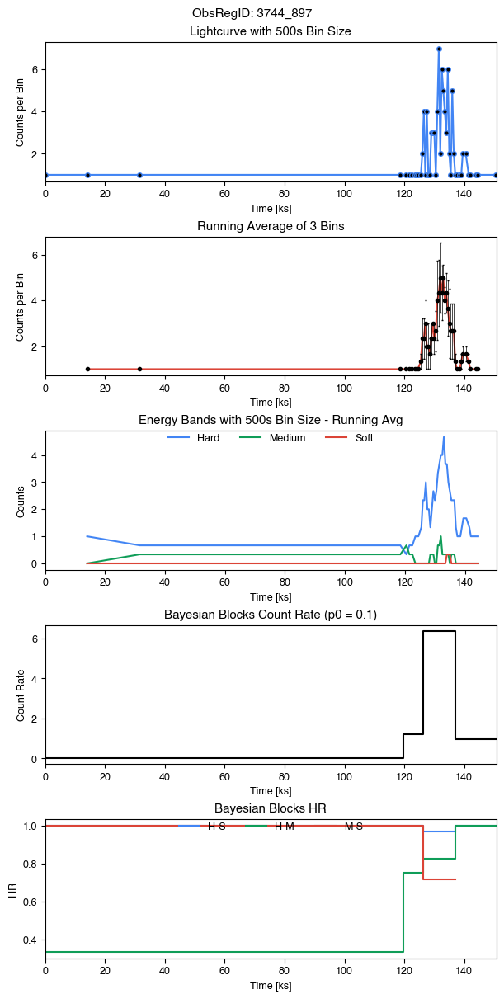

Name: 2CXO J033919.4-354603, ID: 4175-81, Date: 2003-06-03T21:06:34, Counts: 47
RA  54.83099067052018 DEC  -35.76756705359448
varB  0.32 varH  0.2 varM  0.64 varS  nan varINDEX  0.0


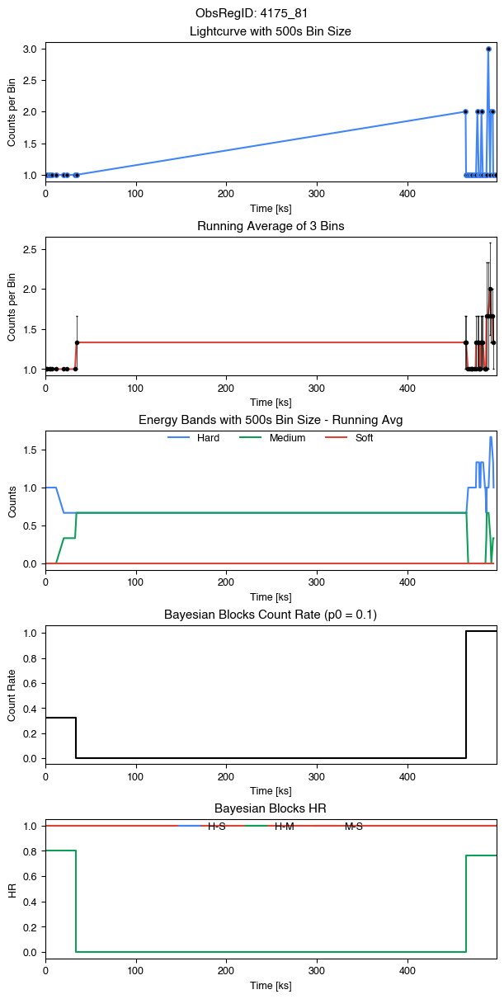

Name: 2CXO J053518.5-052147, ID: 4373-1419, Date: 2003-01-13T07:51:03, Counts: 47
RA  83.82744297046952 DEC  -5.363218173269097
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


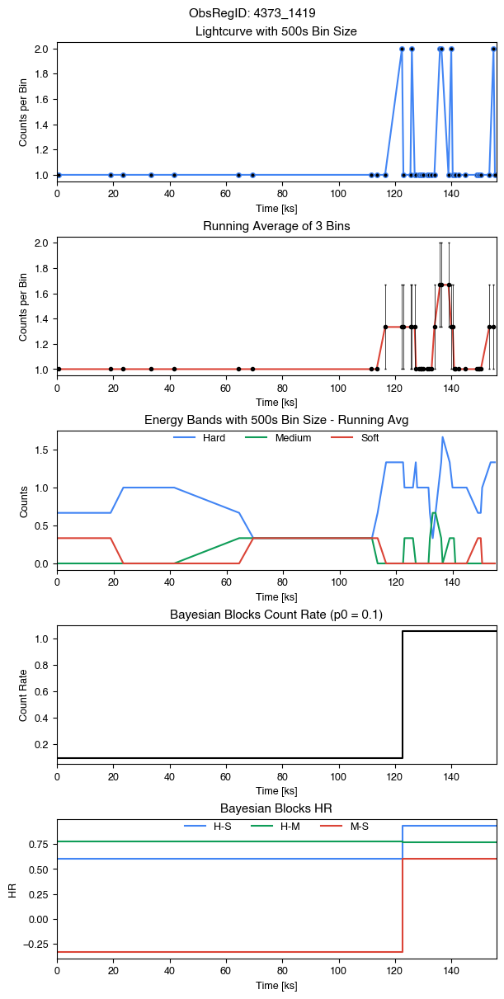

Name: 2CXO J053514.0-052012, ID: 4373-1457, Date: 2003-01-13T07:51:03, Counts: 272
RA  83.80850336925573 DEC  -5.336815995141675
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  10.0


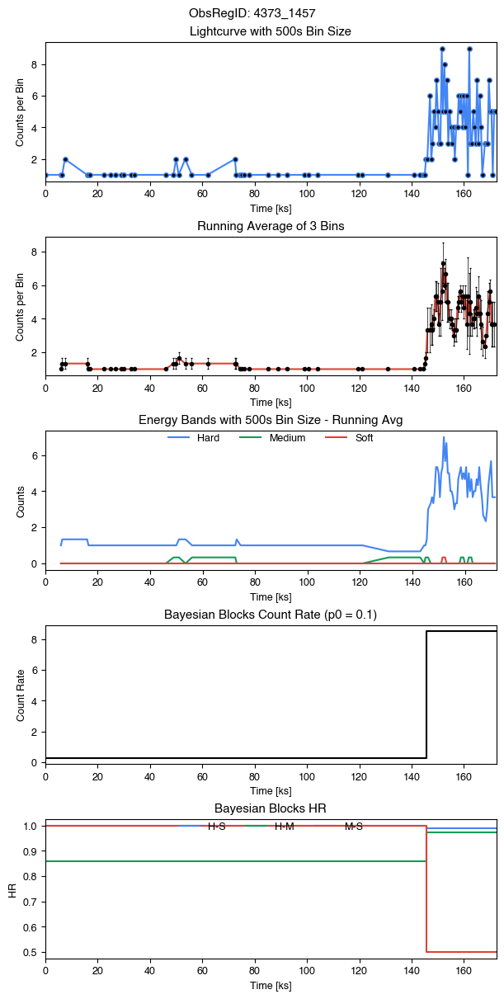

Name: 2CXO J053522.7-051837, ID: 4373-1487, Date: 2003-01-13T07:51:03, Counts: 79
RA  83.84470214501732 DEC  -5.31055026450183
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


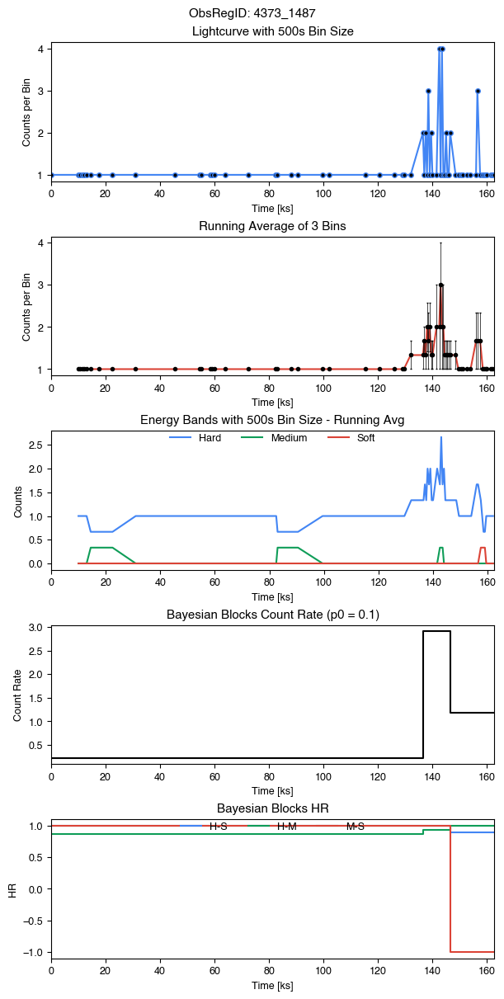

Name: 2CXO J053513.9-052231, ID: 4373-2656, Date: 2003-01-13T07:51:03, Counts: 81
RA  83.80817574612598 DEC  -5.375522583308787
varB  1.0 varH  1.0 varM  0.93 varS  nan varINDEX  9.0


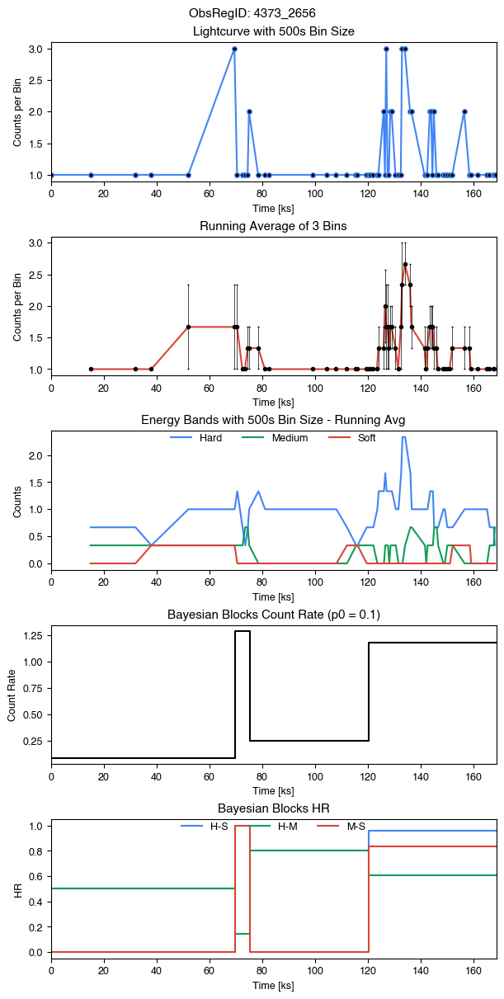

Name: 2CXO J053513.2-052330, ID: 4373-3415, Date: 2003-01-13T07:51:03, Counts: 37
RA  83.80520631053673 DEC  -5.391755543451037
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


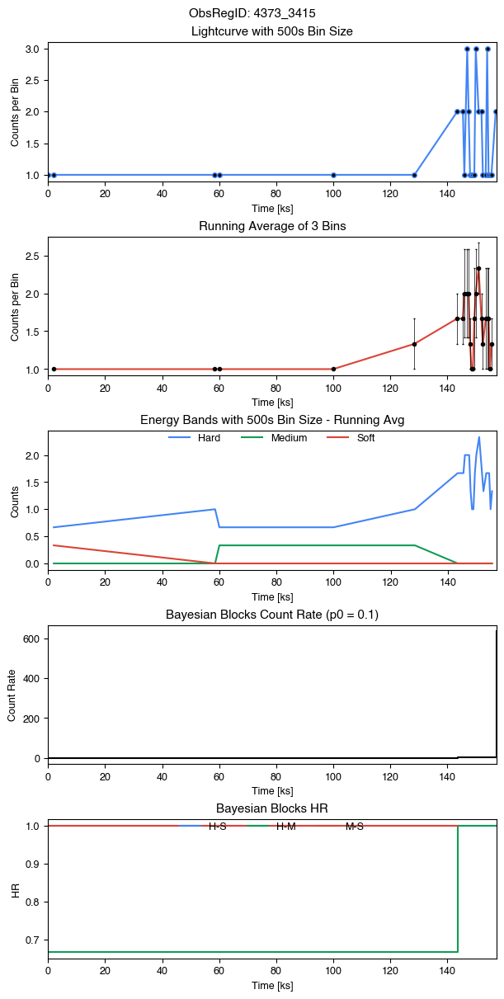

Name: 2CXO J053516.2-052043, ID: 4374-1443, Date: 2003-01-16T00:16:53, Counts: 1291
RA  83.81789360189498 DEC  -5.345559162866237
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  10.0


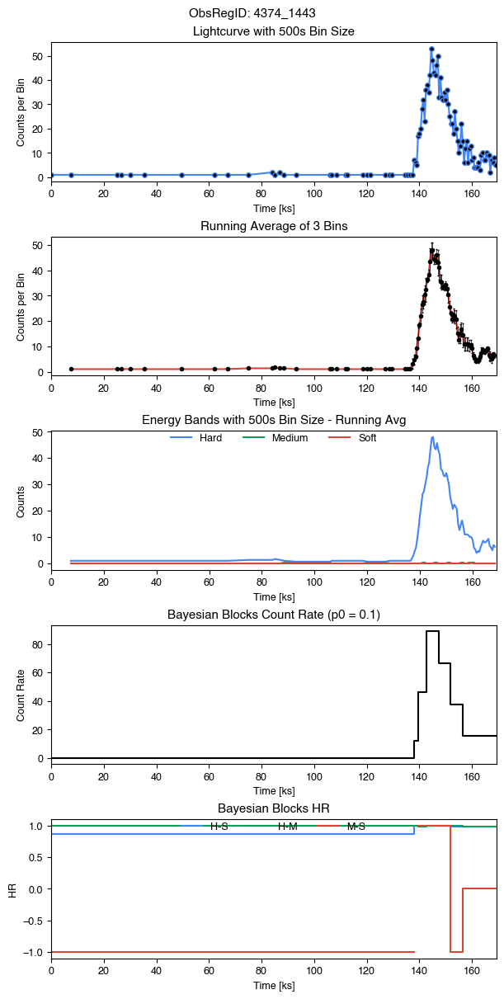

Name: 2CXO J053520.4-051932, ID: 4374-1475, Date: 2003-01-16T00:16:53, Counts: 146
RA  83.83531870331586 DEC  -5.325759711427097
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  10.0


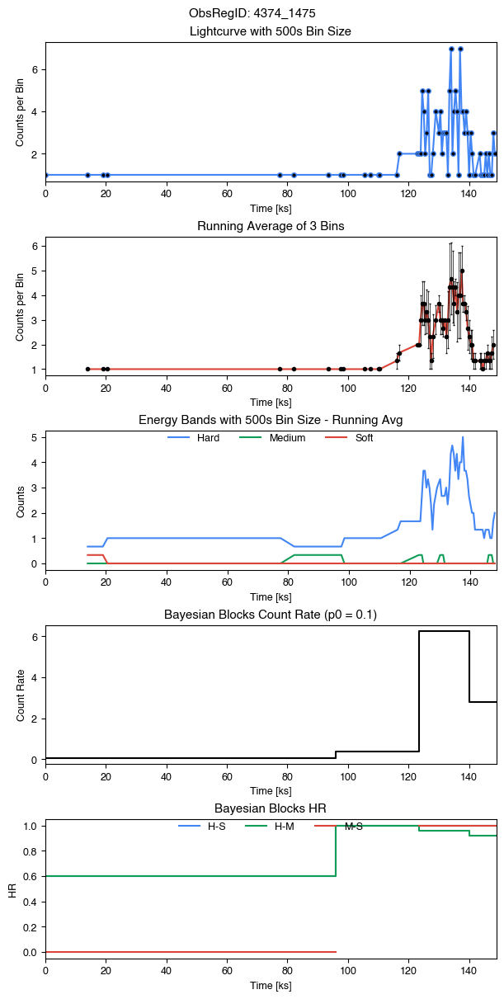

Name: 2CXO J053511.4-052106, ID: 4374-2411, Date: 2003-01-16T00:16:53, Counts: 266
RA  83.79794123968168 DEC  -5.3517464976817335
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


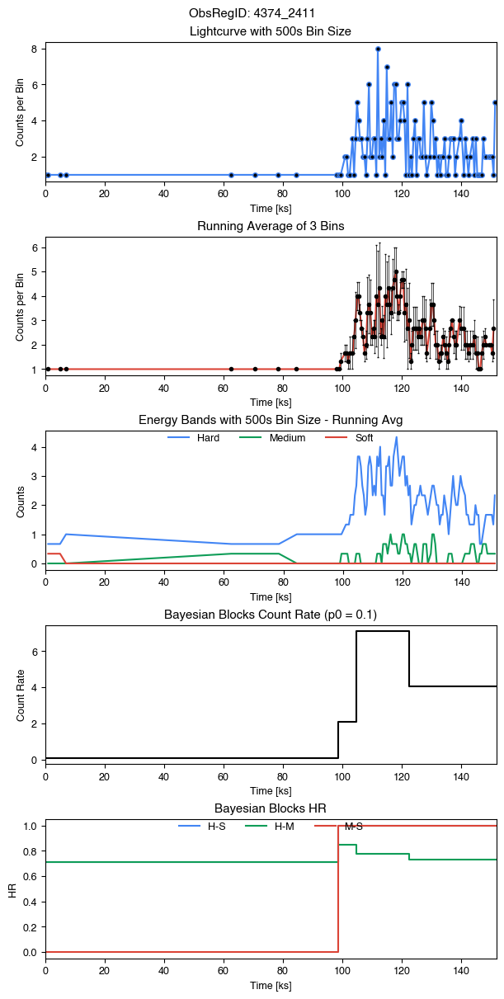

Name: 2CXO J053516.0-051944, ID: 4374-3257, Date: 2003-01-16T00:16:53, Counts: 227
RA  83.81682639524558 DEC  -5.329057000065639
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  10.0


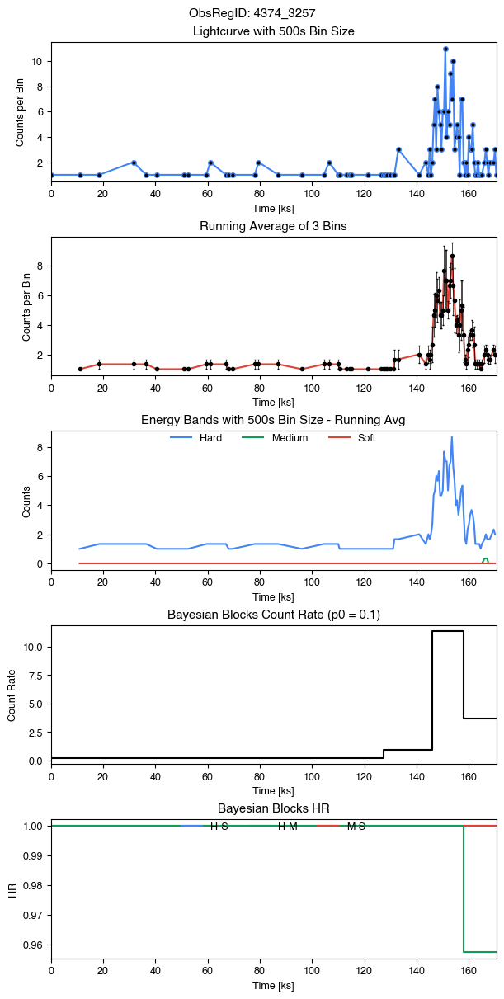

Name: 2CXO J053532.3-052117, ID: 4395-2872, Date: 2003-01-08T21:15:16, Counts: 52
RA  83.88479144301971 DEC  -5.354869629163878
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  8.0


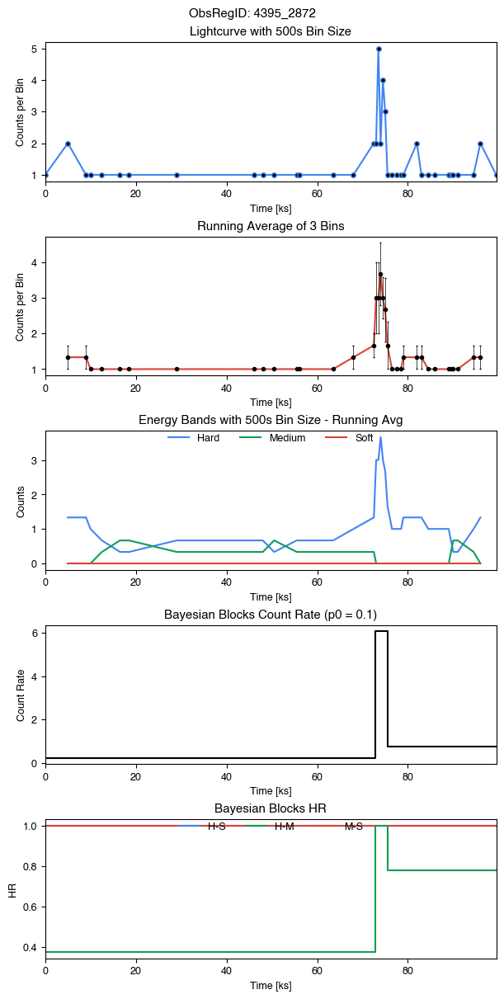

Name: 2CXO J053511.7-052333, ID: 4395-3122, Date: 2003-01-08T21:15:16, Counts: 47
RA  83.79889027133828 DEC  -5.392669841083591
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  8.0


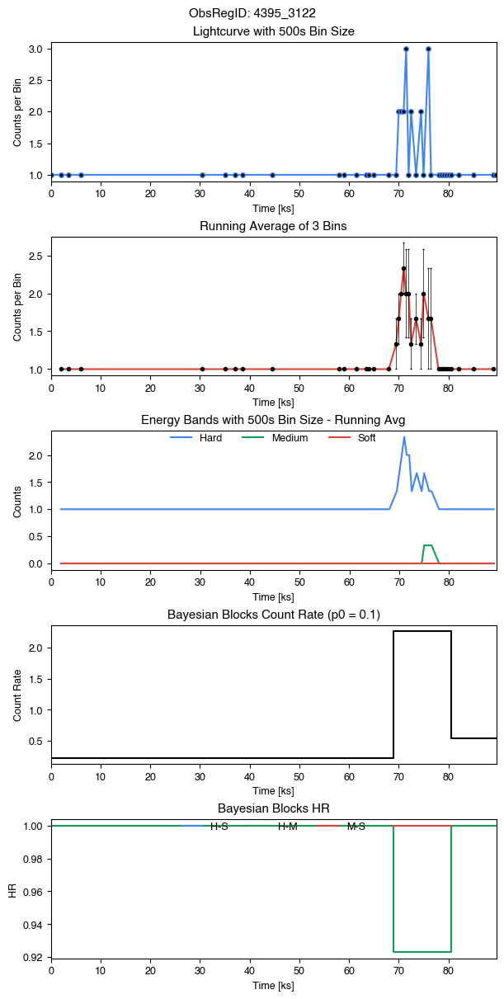

Name: 2CXO J053517.3-052235, ID: 4395-3151, Date: 2003-01-08T21:15:16, Counts: 61
RA  83.82229556048321 DEC  -5.376606713930285
varB  0.9 varH  0.91 varM  nan varS  nan varINDEX  2.0


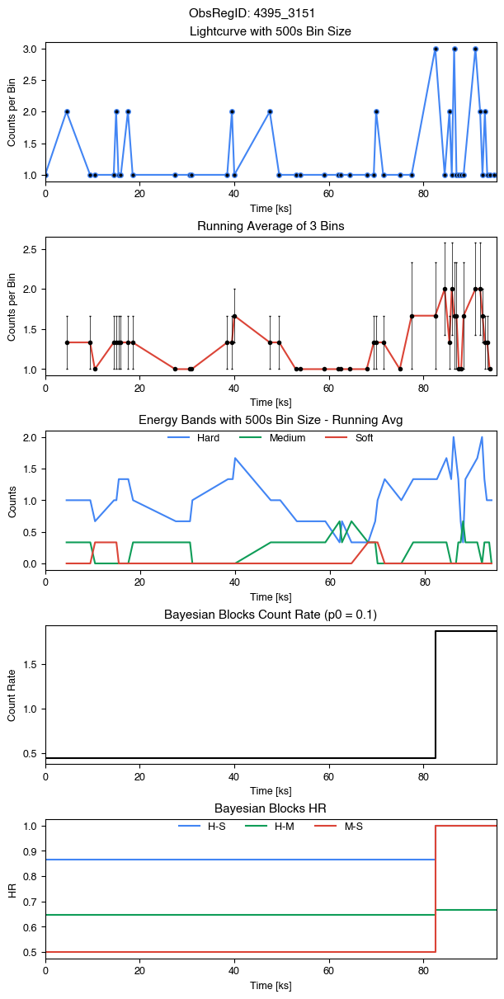

Name: 2CXO J053514.7-052028, ID: 4395-815, Date: 2003-01-08T21:15:16, Counts: 157
RA  83.81147962690727 DEC  -5.341364052824125
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  9.0


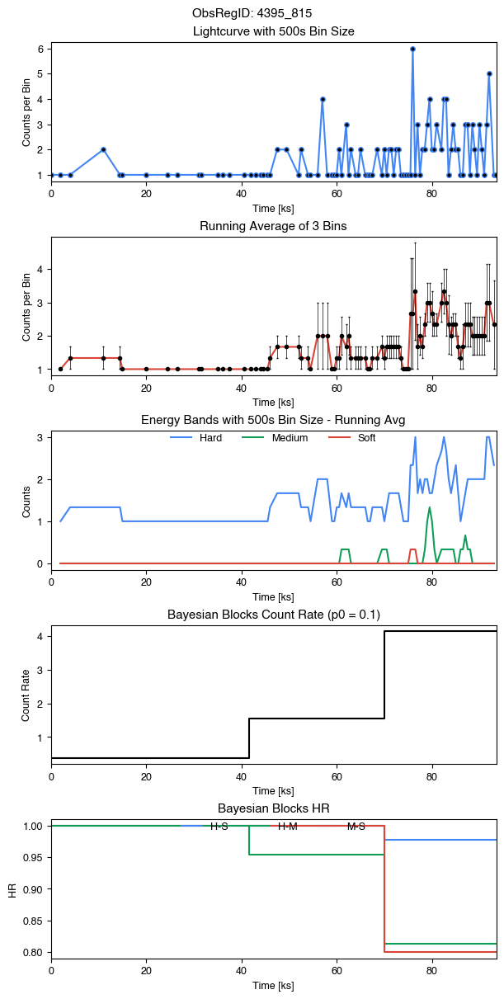

Name: 2CXO J053521.4-051710, ID: 4396-1007, Date: 2003-01-18T14:51:01, Counts: 731
RA  83.83940256774548 DEC  -5.2863016245311725
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


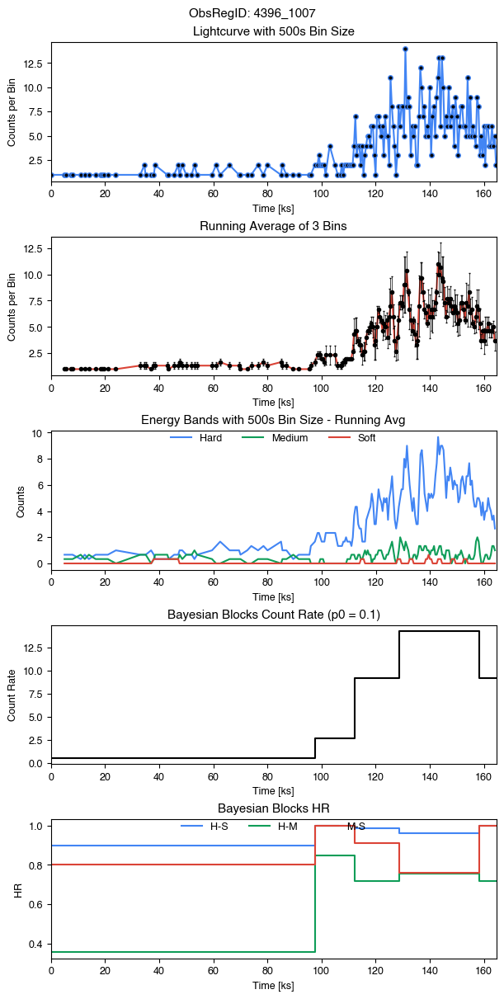

Name: 2CXO J053515.6-051809, ID: 4396-2426, Date: 2003-01-18T14:51:01, Counts: 74
RA  83.81521785270195 DEC  -5.302553710399637
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


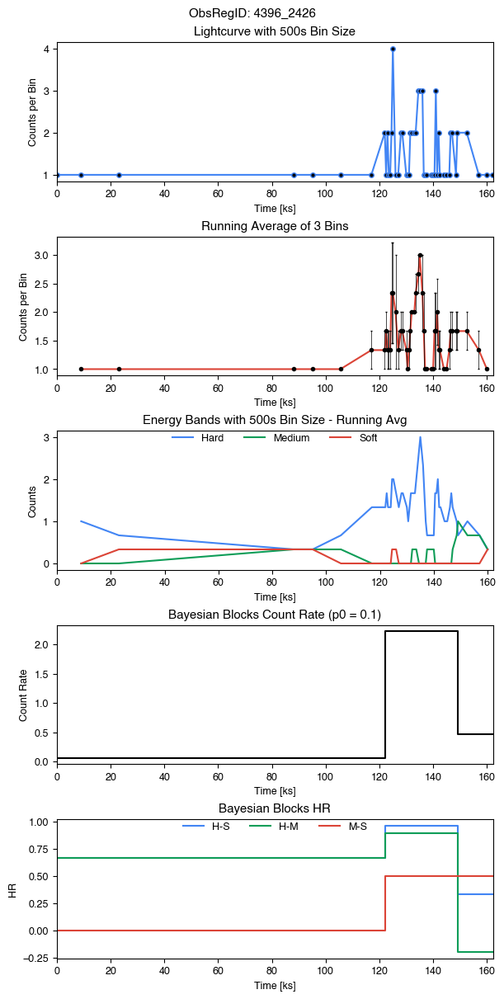

Name: 2CXO J053503.5-052046, ID: 4396-2450, Date: 2003-01-18T14:51:01, Counts: 46
RA  83.76460835044384 DEC  -5.34630417568905
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


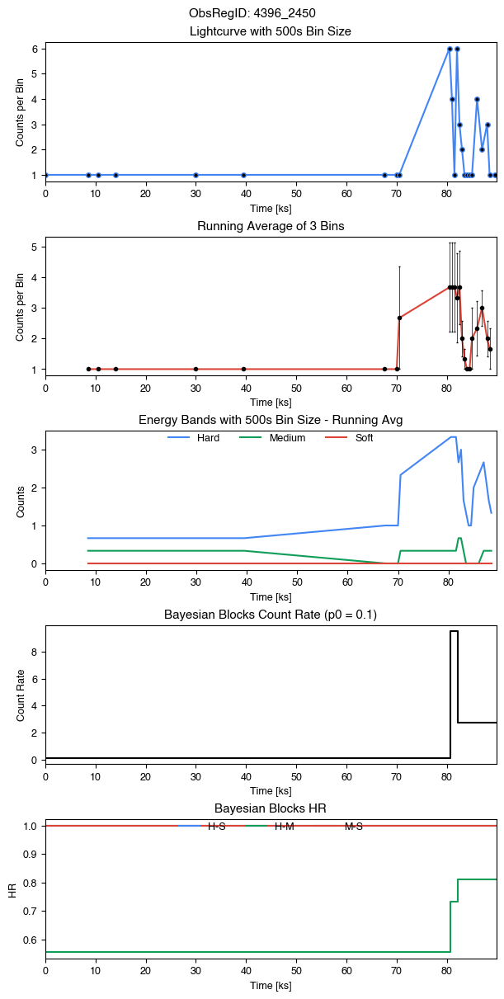

Name: 2CXO J053520.2-051957, ID: 4396-2459, Date: 2003-01-18T14:51:01, Counts: 114
RA  83.83460194698841 DEC  -5.332721056124493
varB  1.0 varH  1.0 varM  0.99 varS  nan varINDEX  10.0


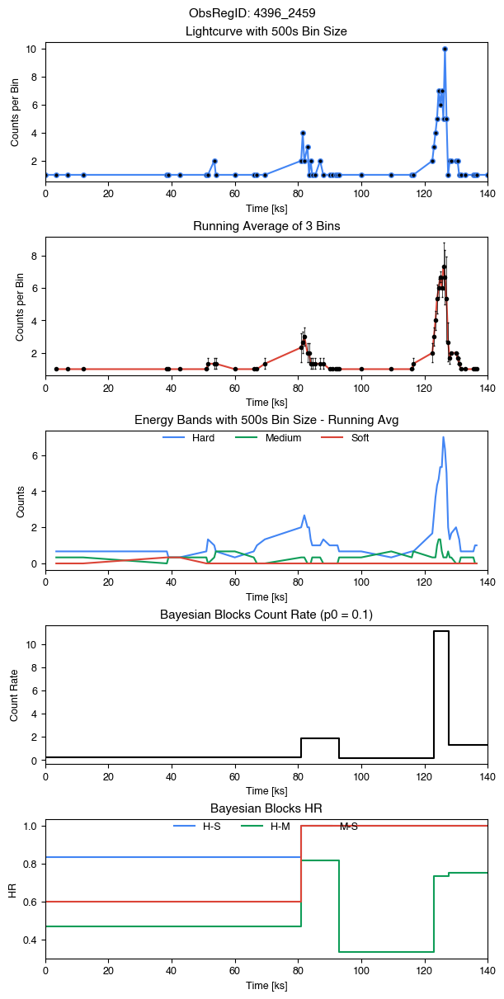

Name: 2CXO J053513.2-052239, ID: 4396-3112, Date: 2003-01-18T14:51:01, Counts: 271
RA  83.80542944280216 DEC  -5.377557370496054
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  10.0


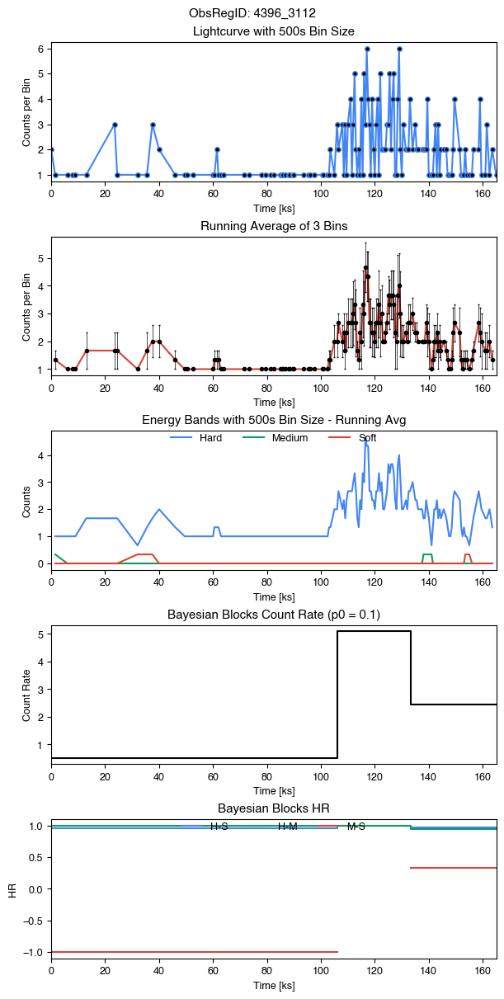

Name: 2CXO J053514.3-052232, ID: 4396-3135, Date: 2003-01-18T14:51:01, Counts: 777
RA  83.80980427700138 DEC  -5.375754556764319
varB  1.0 varH  1.0 varM  0.97 varS  nan varINDEX  10.0


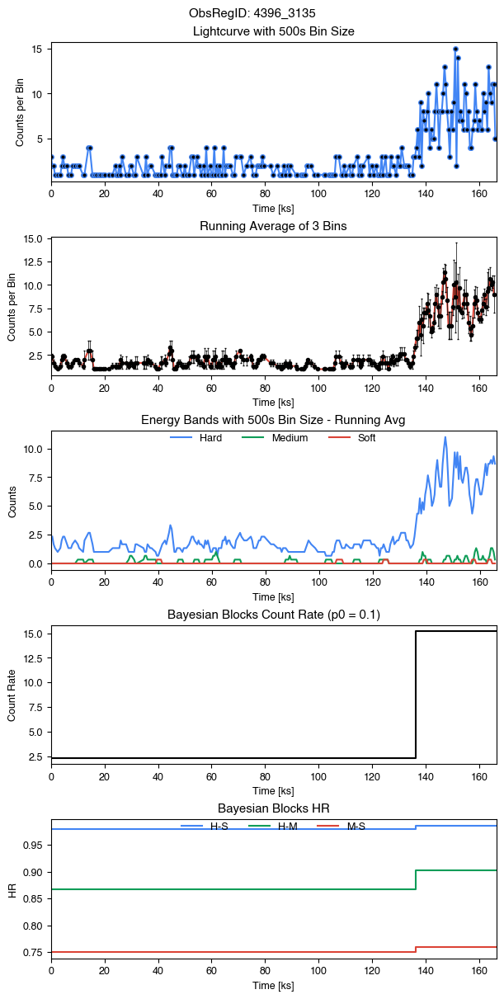

Name: 2CXO J053516.2-052224, ID: 4396-3287, Date: 2003-01-18T14:51:01, Counts: 69
RA  83.81762234709197 DEC  -5.3734160859545135
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  9.0


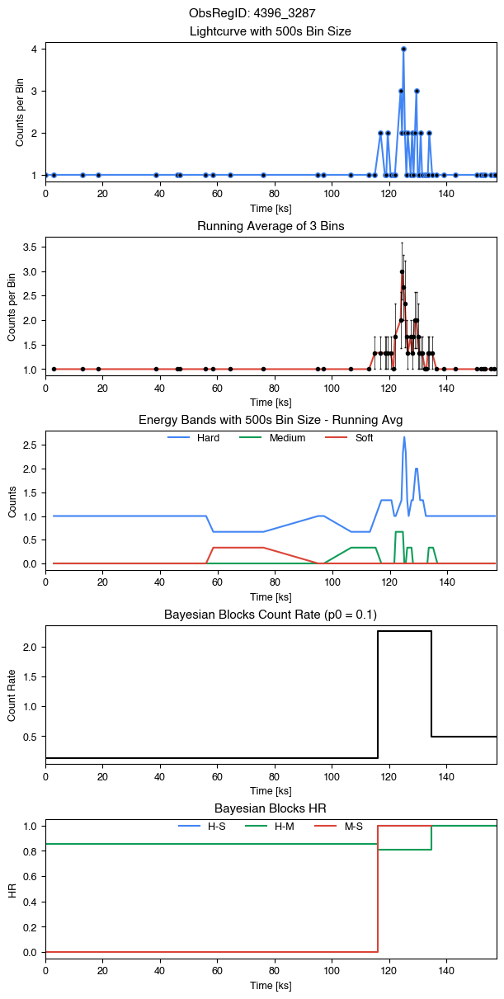

Name: 2CXO J053513.2-052052, ID: 4396-783, Date: 2003-01-18T14:51:01, Counts: 341
RA  83.80504783019097 DEC  -5.347961293174306
varB  1.0 varH  1.0 varM  1.0 varS  0.49 varINDEX  10.0


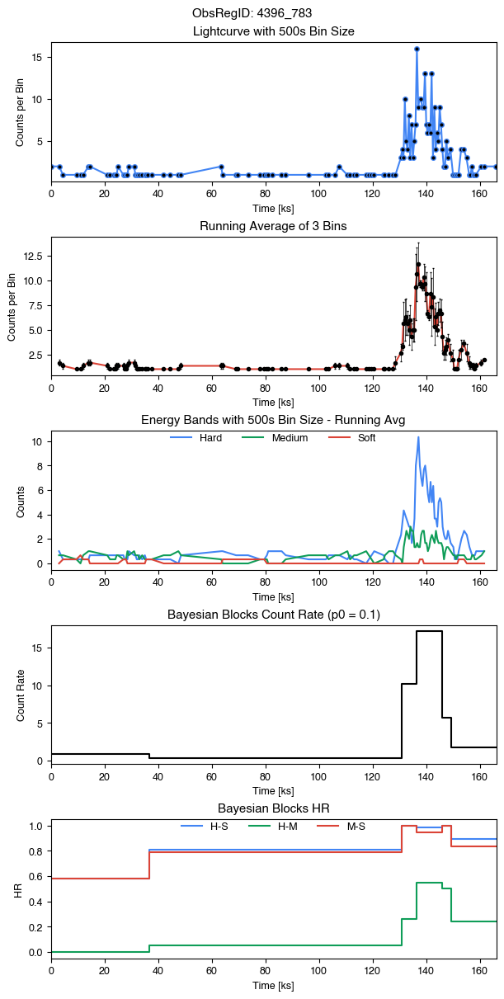

Name: 2CXO J180339.4-242248, ID: 4444-205, Date: 2003-07-28T00:21:10, Counts: 34
RA  270.91447132029214 DEC  -24.380147986694823
varB  1.0 varH  1.0 varM  0.5 varS  nan varINDEX  7.0


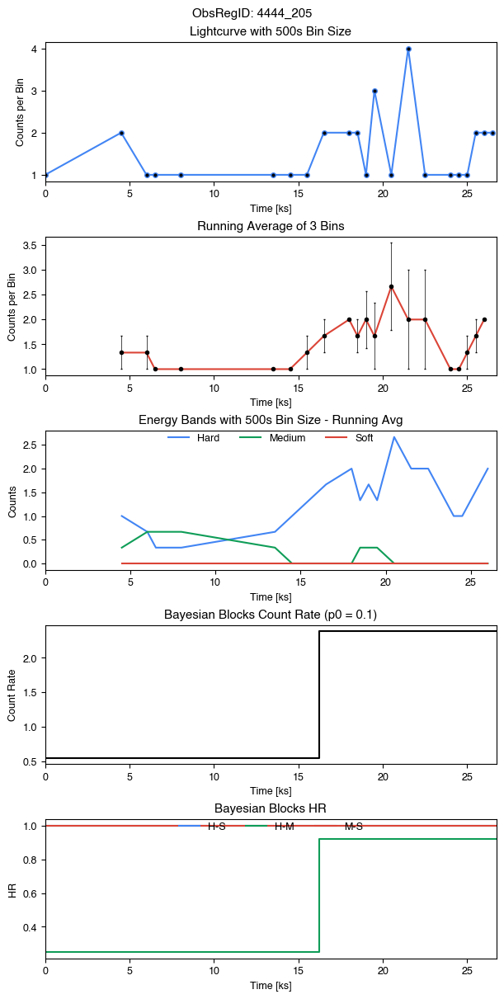

Name: 2CXO J163949.4-485225, ID: 4503-92, Date: 2004-10-25T03:02:12, Counts: 69
RA  249.95579043315703 DEC  -48.87367075444343
varB  1.0 varH  1.0 varM  0.97 varS  nan varINDEX  10.0


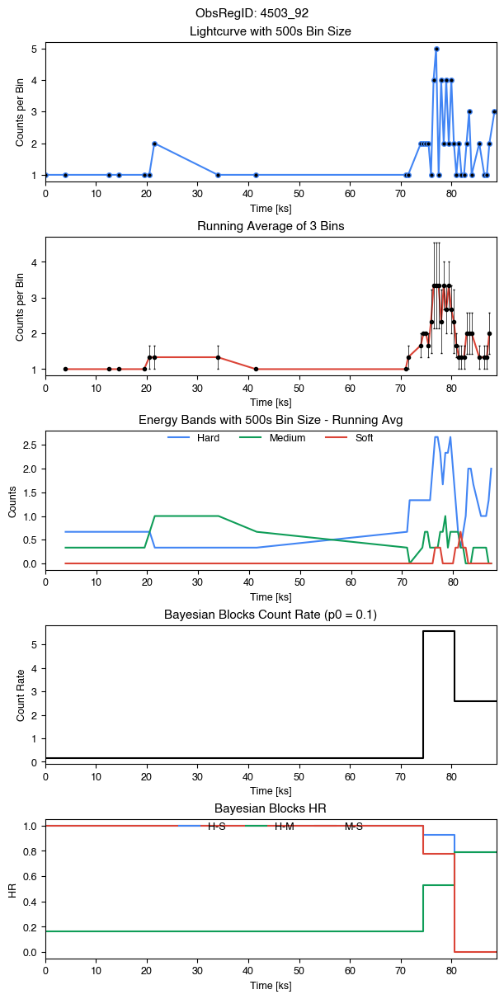

Name: 2CXO J164657.0-455231, ID: 5411-17, Date: 2005-06-18T16:30:23, Counts: 42
RA  251.73771334305889 DEC  -45.87532493730172
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  9.0


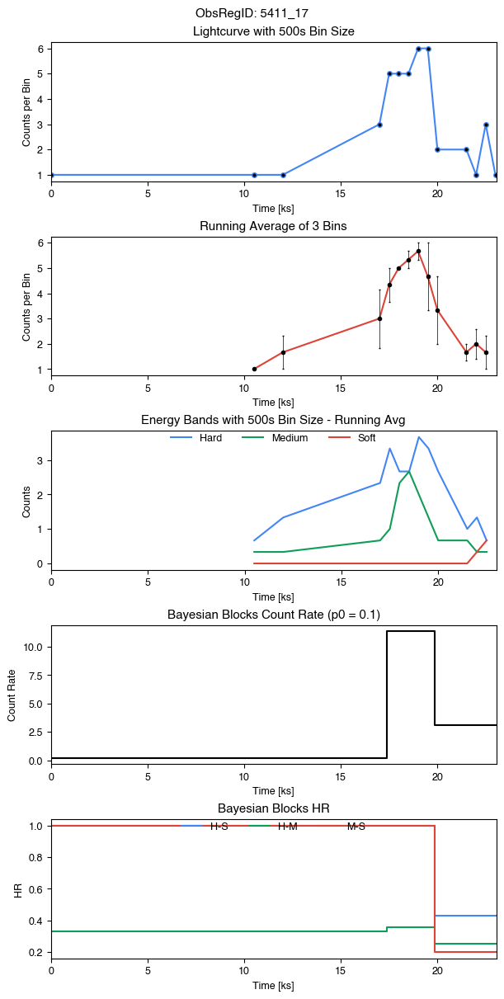

Name: 2CXO J022706.9+615219, ID: 5889-43, Date: 2005-04-23T03:51:08, Counts: 62
RA  36.77887352717448 DEC  61.872125455408
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  10.0


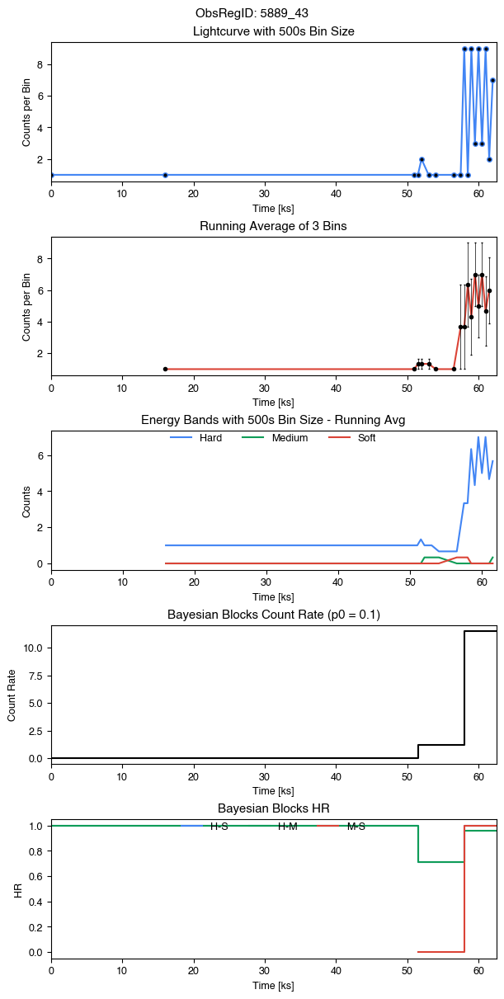

Name: 2CXO J162738.9-244020, ID: 635-77, Date: 2000-04-13T18:52:44, Counts: 658
RA  246.91233707110985 DEC  -24.672443885306524
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


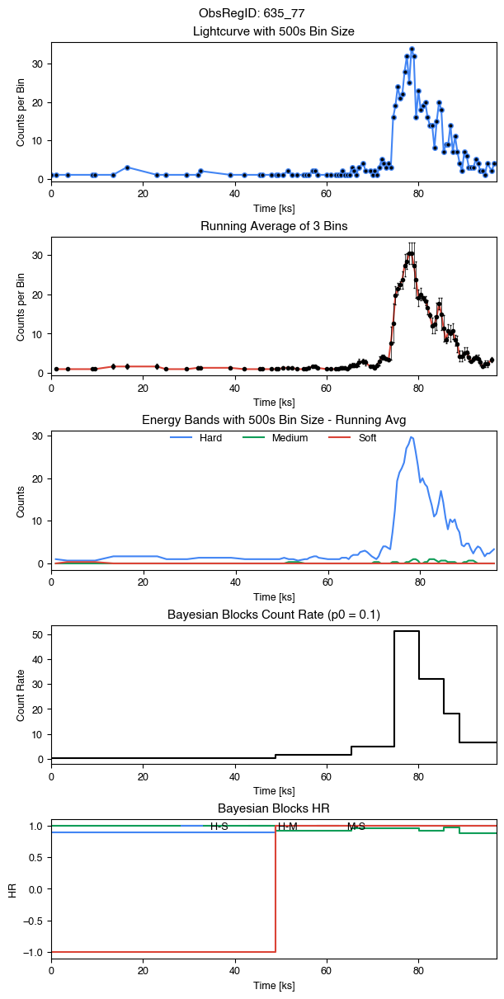

Name: 2CXO J013402.8+304151, ID: 6376-275, Date: 2006-03-03T21:36:16, Counts: 33
RA  23.51202130727671 DEC  30.697582529447008
varB  0.82 varH  0.86 varM  nan varS  nan varINDEX  2.0


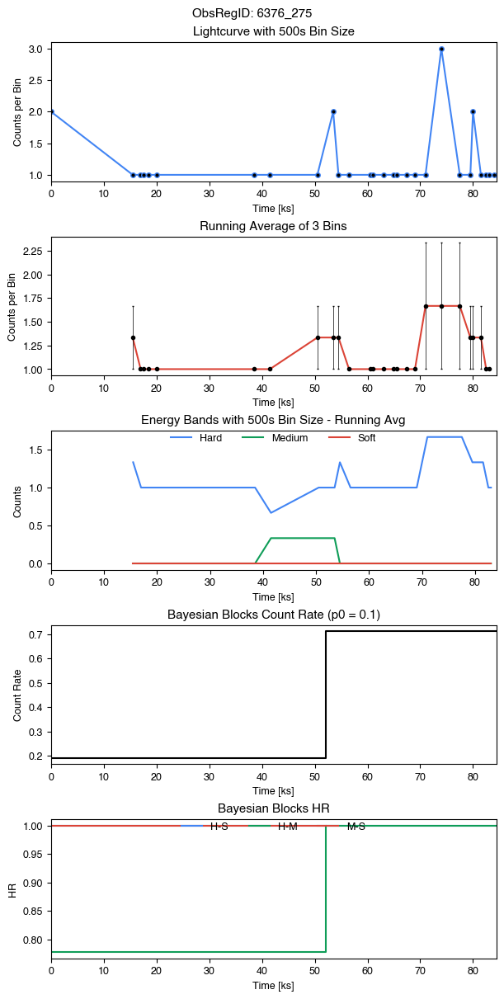

Name: 2CXO J162703.0-242614, ID: 637-87, Date: 2000-05-16T00:00:29, Counts: 57
RA  246.76251613975975 DEC  -24.43765938575767
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  8.0


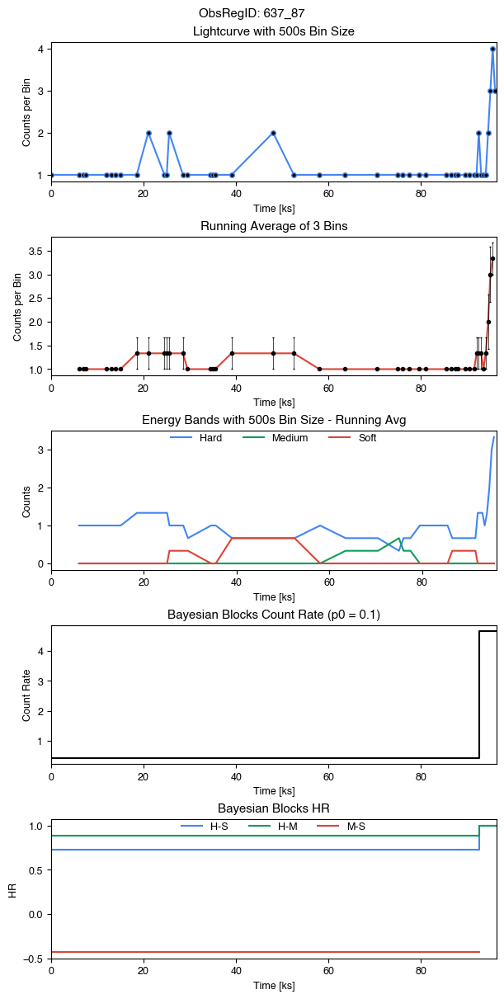

Name: 2CXO J182031.0-161105, ID: 6403-1456, Date: 2006-11-06T22:40:37, Counts: 94
RA  275.1291699188912 DEC  -16.184878036578027
varB  1.0 varH  1.0 varM  0.99 varS  nan varINDEX  10.0


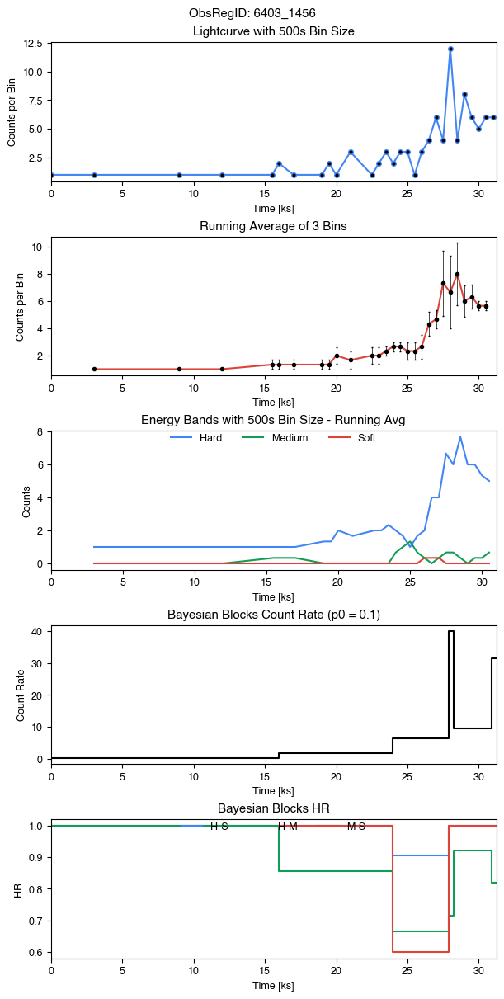

Name: 2CXO J182022.7-161105, ID: 6403-1457, Date: 2006-11-06T22:40:37, Counts: 88
RA  275.09478484988995 DEC  -16.18477101847073
varB  1.0 varH  1.0 varM  0.73 varS  nan varINDEX  9.0


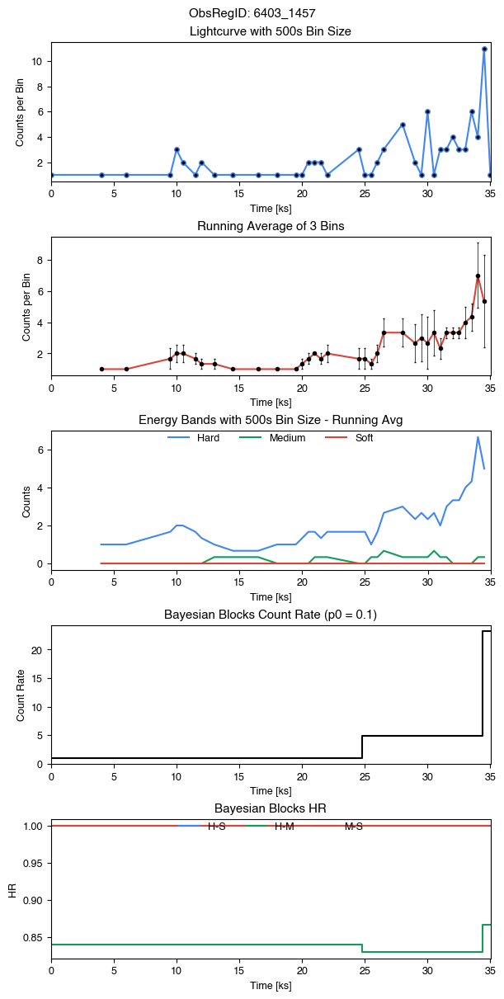

Name: 2CXO J182003.1-160940, ID: 6403-642, Date: 2006-11-06T22:40:37, Counts: 51
RA  275.0130958376234 DEC  -16.161289784895544
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  9.0


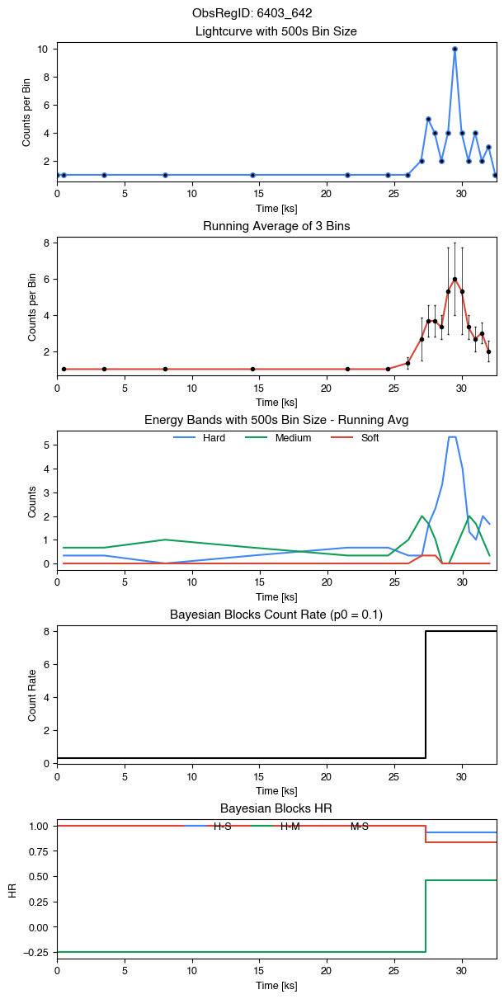

Name: 2CXO J182028.3-160928, ID: 6403-680, Date: 2006-11-06T22:40:37, Counts: 52
RA  275.1181897676398 DEC  -16.158046833232277
varB  1.0 varH  1.0 varM  0.97 varS  nan varINDEX  7.0


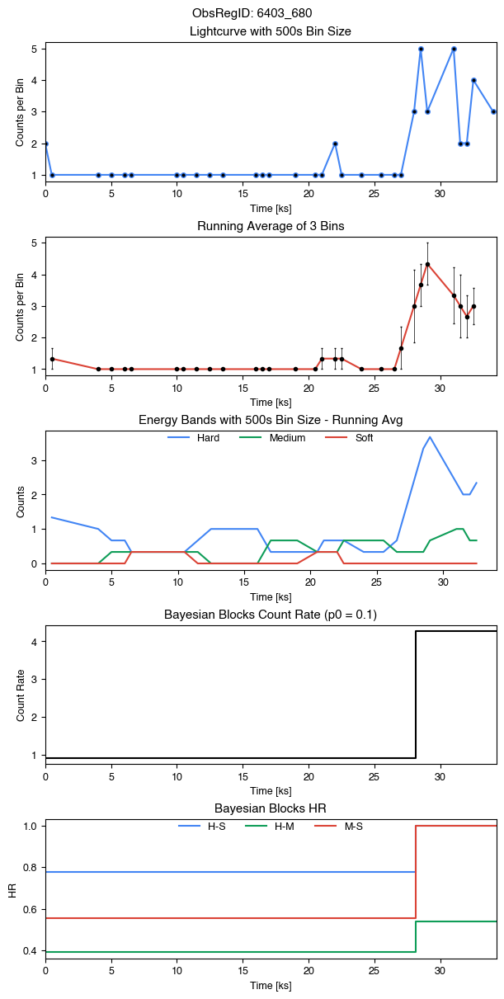

Name: 2CXO J102412.7-574424, ID: 6411-683, Date: 2006-09-28T06:05:42, Counts: 42
RA  156.0529366799409 DEC  -57.74021045470814
varB  1.0 varH  1.0 varM  0.99 varS  nan varINDEX  9.0


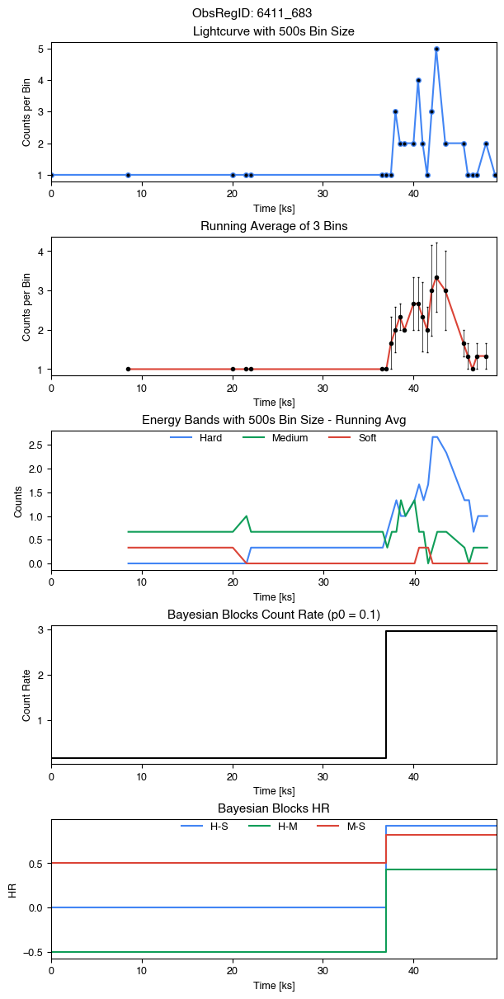

Name: 2CXO J182027.3-161254, ID: 6420-1370, Date: 2006-08-01T02:33:18, Counts: 81
RA  275.1141470443796 DEC  -16.215228285303144
varB  1.0 varH  1.0 varM  0.49 varS  nan varINDEX  9.0


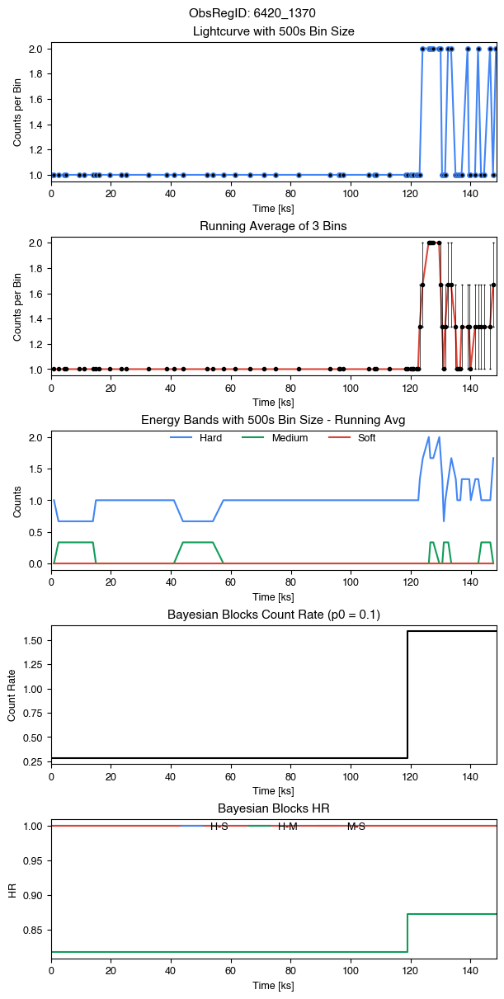

Name: 2CXO J182023.6-161157, ID: 6420-1411, Date: 2006-08-01T02:33:18, Counts: 144
RA  275.0984464596197 DEC  -16.199290204819444
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


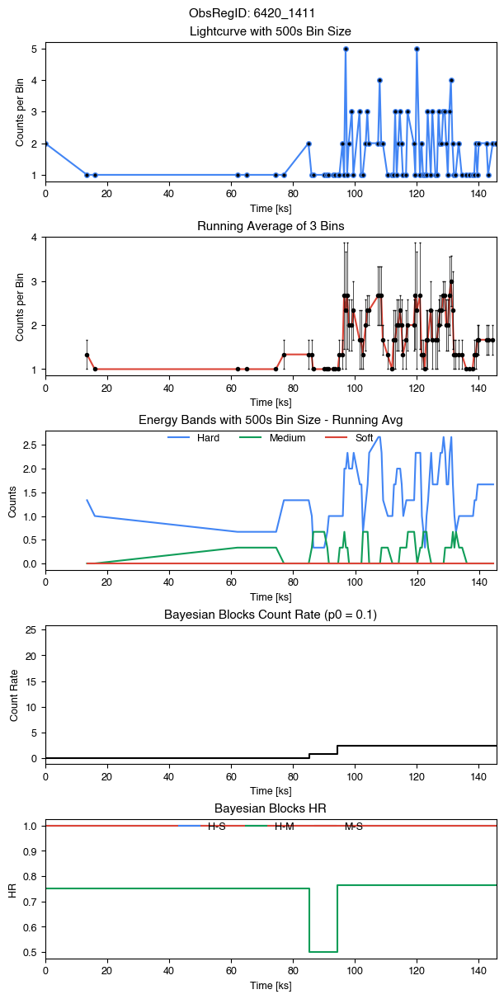

Name: 2CXO J182020.4-160615, ID: 6420-1591, Date: 2006-08-01T02:33:18, Counts: 251
RA  275.0851495847445 DEC  -16.10426414079061
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


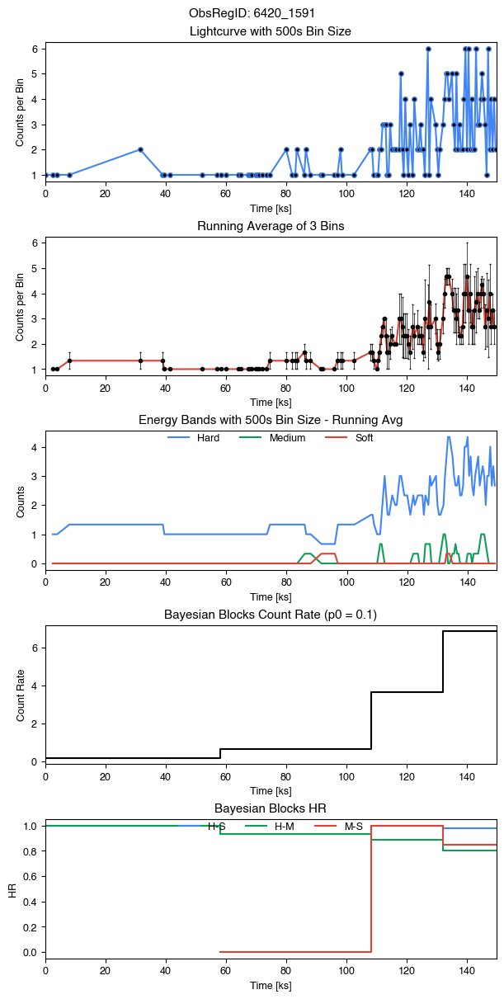

Name: 2CXO J182019.2-161326, ID: 6420-2357, Date: 2006-08-01T02:33:18, Counts: 1148
RA  275.08024184538124 DEC  -16.22407657876707
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


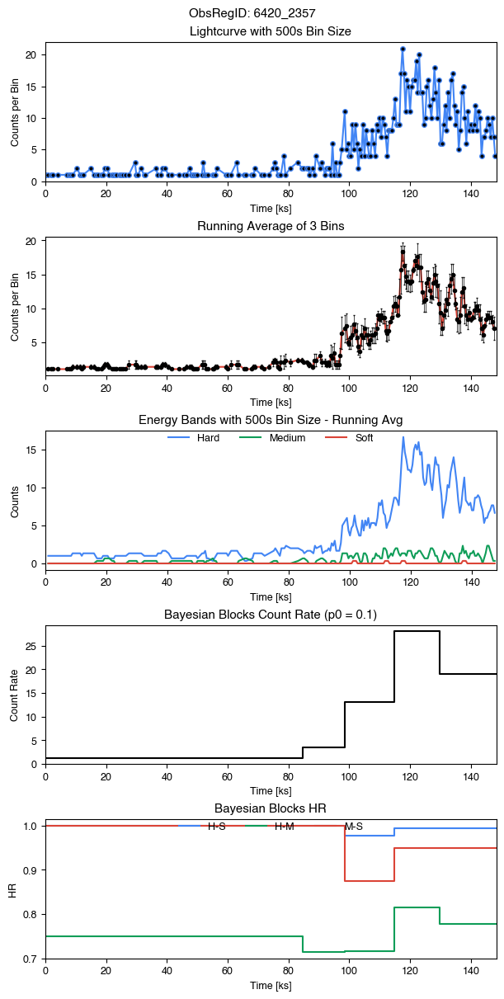

Name: 2CXO J182020.5-161024, ID: 6420-492, Date: 2006-08-01T02:33:18, Counts: 216
RA  275.085729002598 DEC  -16.17354855219388
varB  1.0 varH  1.0 varM  0.99 varS  nan varINDEX  10.0


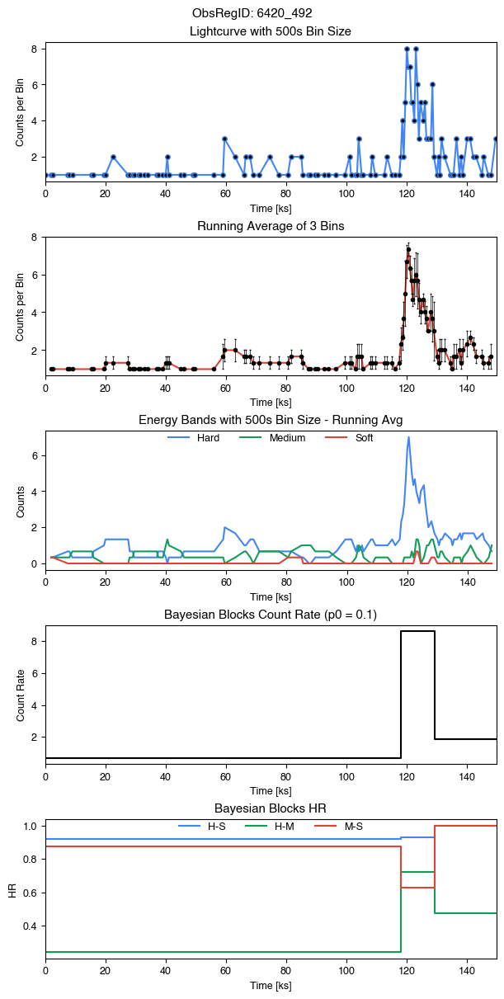

Name: 2CXO J182031.9-160956, ID: 6420-581, Date: 2006-08-01T02:33:18, Counts: 43
RA  275.13325873161307 DEC  -16.165819222172647
varB  0.88 varH  0.99 varM  0.47 varS  nan varINDEX  5.0


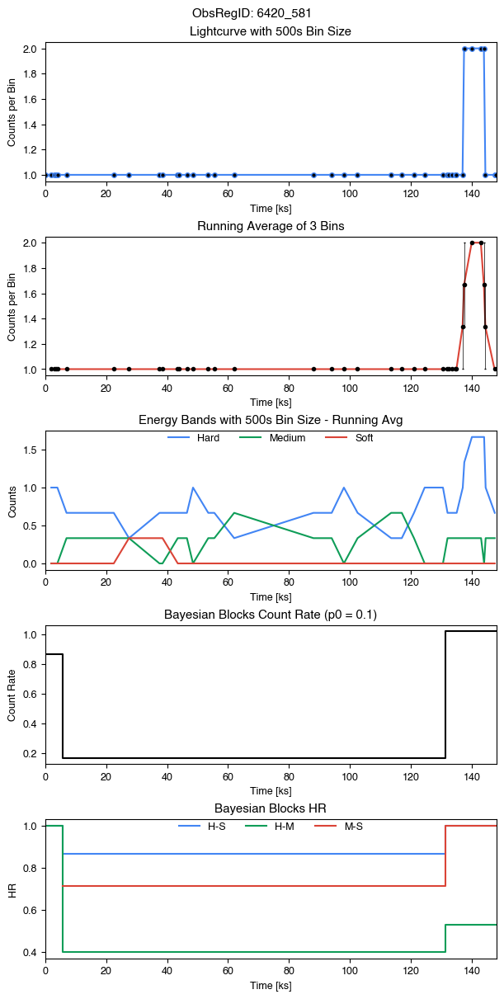

Name: 2CXO J182029.9-160517, ID: 6421-1018, Date: 2006-08-07T00:35:24, Counts: 36
RA  275.1249342631047 DEC  -16.088344908823284
varB  1.0 varH  1.0 varM  0.67 varS  nan varINDEX  8.0


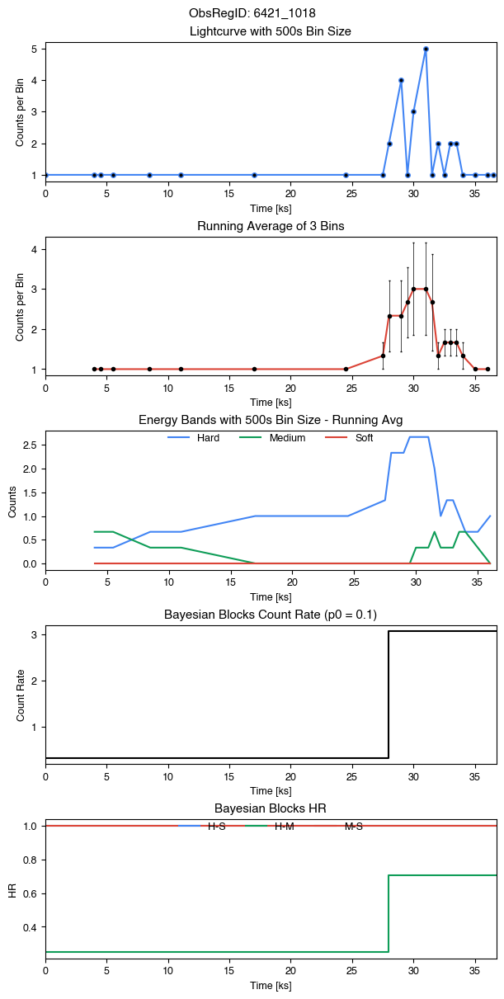

Name: 2CXO J182027.5-160638, ID: 6421-1584, Date: 2006-08-07T00:35:24, Counts: 193
RA  275.1149767954372 DEC  -16.110586242395733
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


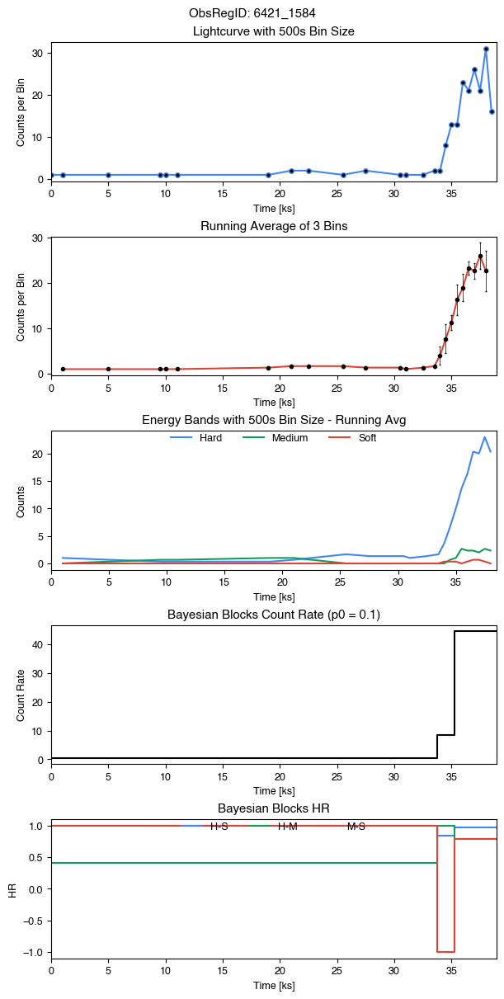

Name: 2CXO J085928.0-434510, ID: 6433-97, Date: 2006-09-23T20:04:58, Counts: 787
RA  134.86704652968956 DEC  -43.7530170470878
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


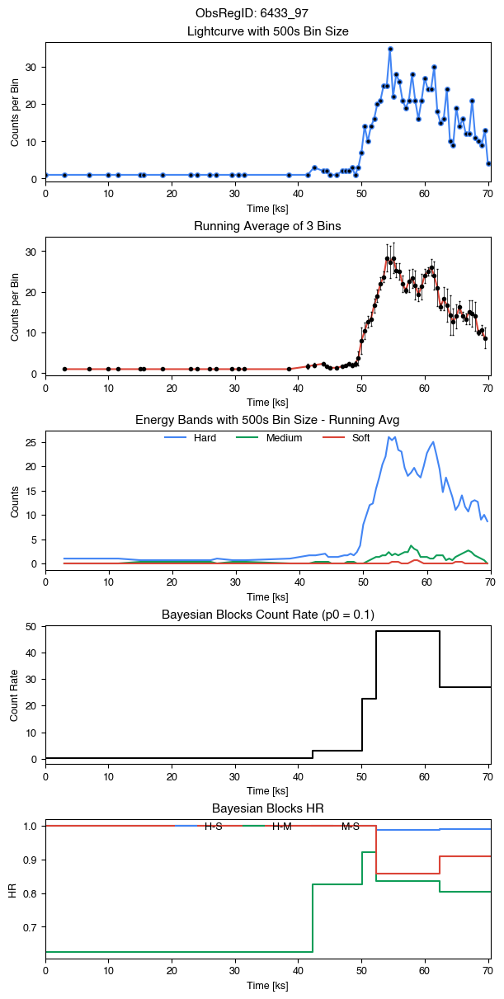

Name: 2CXO J183115.2-020535, ID: 7420-104, Date: 2007-08-13T00:06:22, Counts: 64
RA  277.81355156338236 DEC  -2.093286195024899
varB  1.0 varH  1.0 varM  0.88 varS  nan varINDEX  9.0


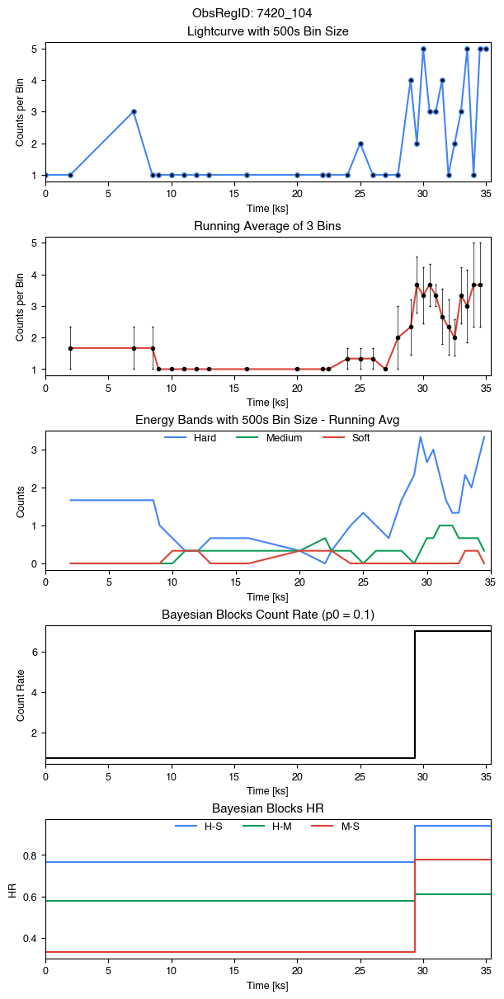

Name: 2CXO J183124.5-020231, ID: 7420-182, Date: 2007-08-13T00:06:22, Counts: 40
RA  277.85233254299965 DEC  -2.04219545272917
varB  1.0 varH  1.0 varM  0.5 varS  nan varINDEX  8.0


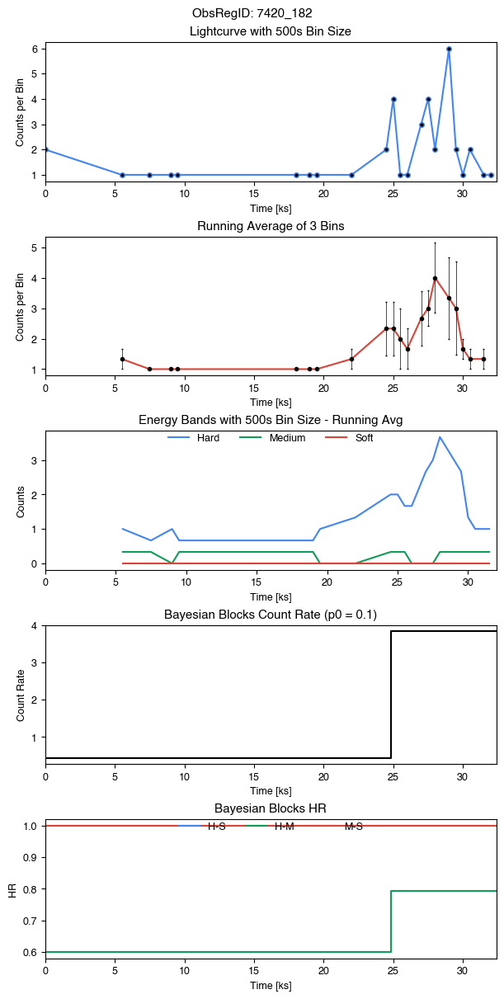

Name: 2CXO J203916.3+422256, ID: 7444-129, Date: 2007-08-22T03:48:35, Counts: 36
RA  309.8179149753146 DEC  42.382449776474616
varB  1.0 varH  0.99 varM  0.68 varS  nan varINDEX  7.0


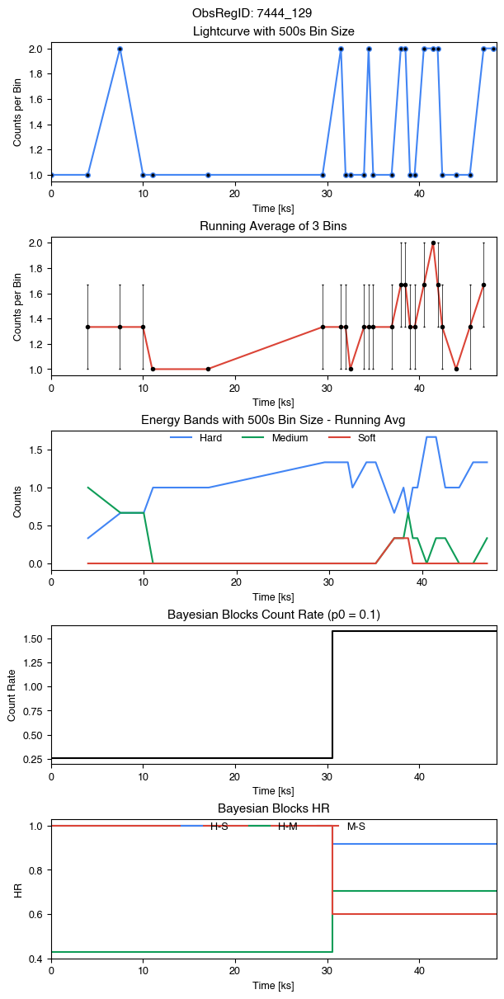

Name: 2CXO J203902.3+422158, ID: 7444-333, Date: 2007-08-22T03:48:35, Counts: 35
RA  309.7596705750816 DEC  42.36636078862648
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  8.0


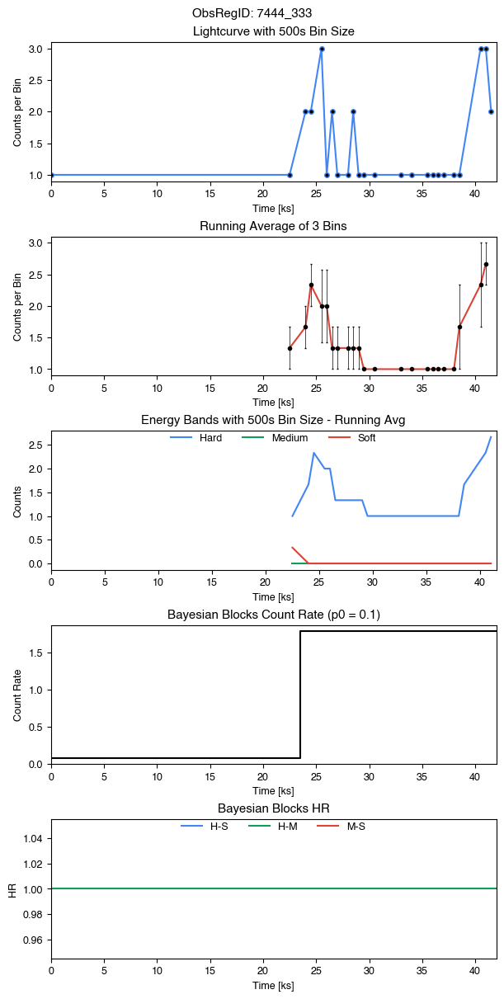

Name: 2CXO J182016.5-161003, ID: 8460-1521, Date: 2006-11-08T04:45:27, Counts: 119
RA  275.0689109345627 DEC  -16.167573295810744
varB  1.0 varH  1.0 varM  nan varS  nan varINDEX  10.0


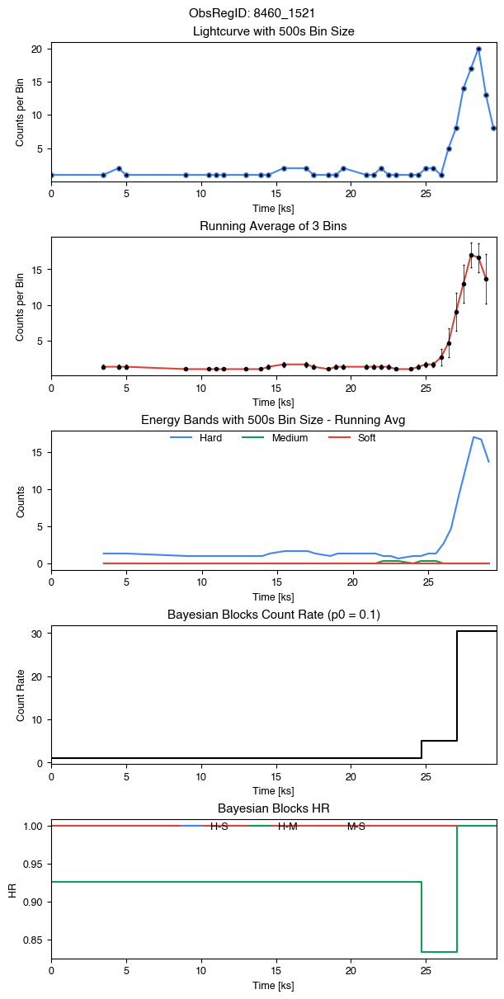

Name: 2CXO J182019.8-160824, ID: 8461-856, Date: 2006-11-11T00:40:30, Counts: 56
RA  275.0825495720554 DEC  -16.140160133896355
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


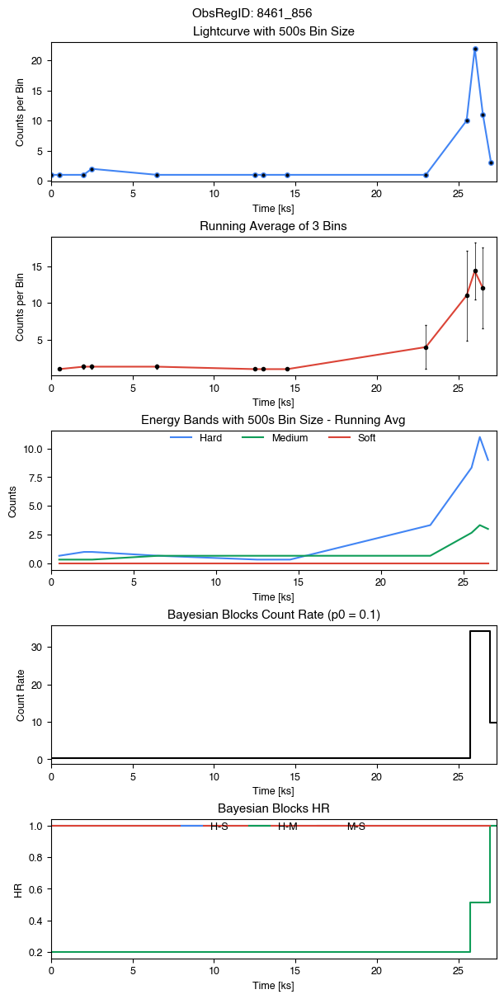

Name: 2CXO J225617.1+620443, ID: 8898-99, Date: 2008-04-08T12:32:26, Counts: 95
RA  344.0712667664104 DEC  62.07875041886813
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


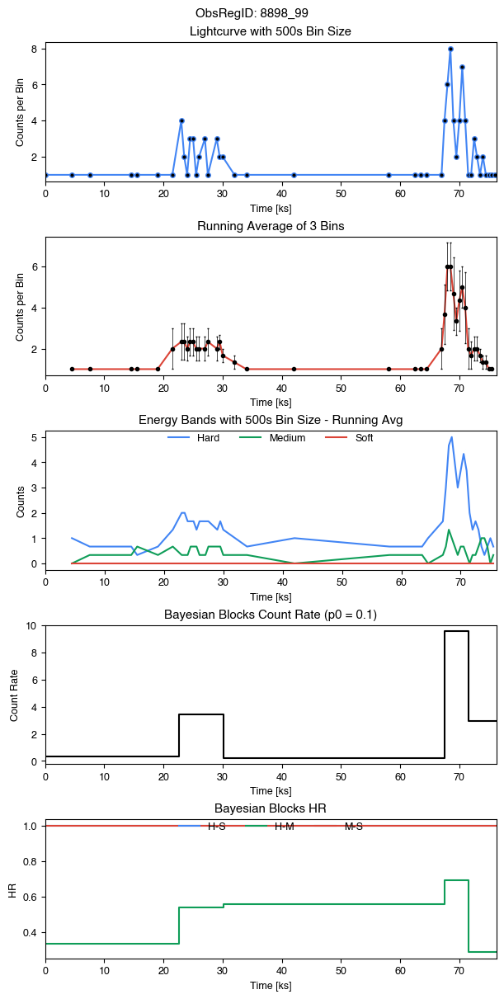

Name: 2CXO J182031.9-161030, ID: 972-2247, Date: 2002-03-02T17:28:27, Counts: 229
RA  275.1332353056563 DEC  -16.175119279130083
varB  1.0 varH  1.0 varM  1.0 varS  nan varINDEX  10.0


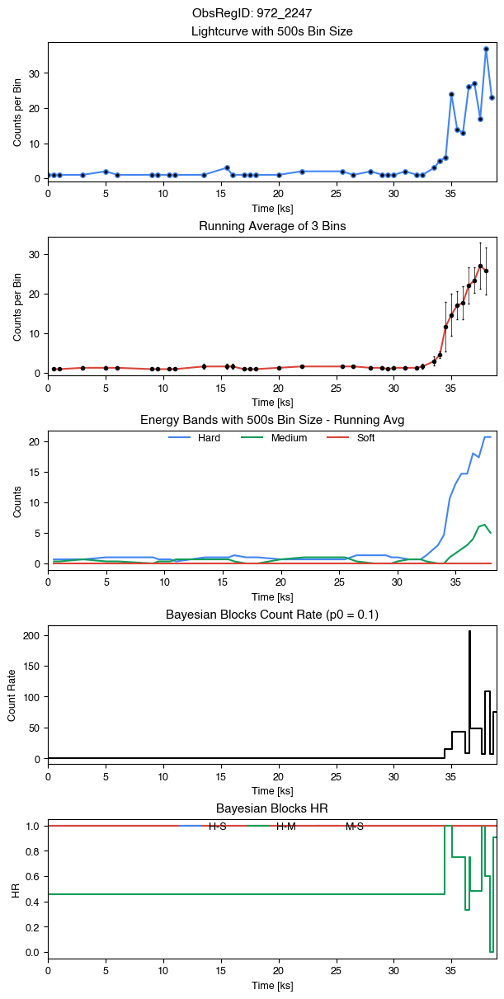

Name: 2CXO J181852.1-134809, ID: 978-204, Date: 2001-07-30T19:11:02, Counts: 53
RA  274.71724183466245 DEC  -13.80280781764658
varB  1.0 varH  1.0 varM  0.72 varS  nan varINDEX  9.0


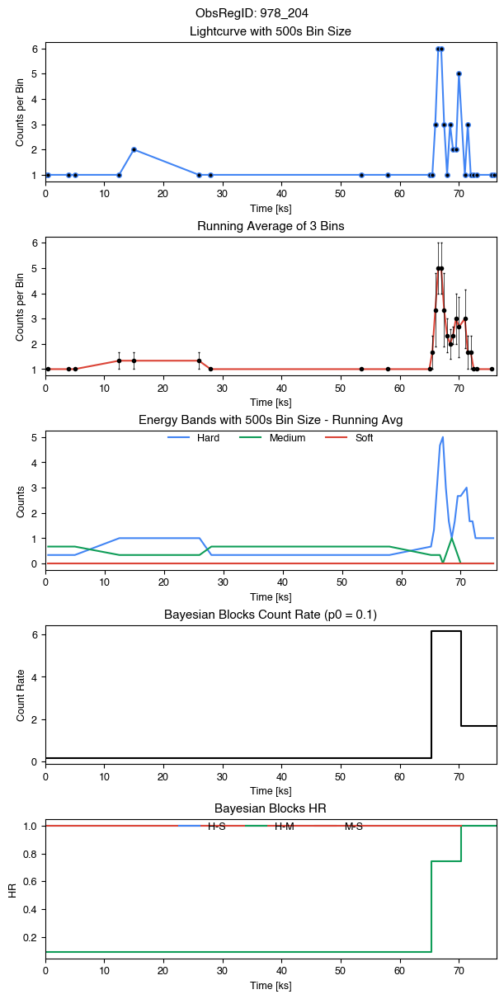

In [47]:
# ###
df_properties_anomalies = df_properties_anomalies2 # comment out for clusters
# df_select = points_in_box# comment out for clusters
# df_properties_anomalies = df_properties_anomalies[df_properties_anomalies['var_index_b']>5] #COMMENT OUT
potential_anomalies = df_properties_anomalies['obsreg_id']
# potential_anomalies = df_select['obsreg_id']
print(len(potential_anomalies))
keep = potential_anomalies.values[0:]


# keep = ['13814_86','2540_253','633_2117']
# keep = ['6442_37','11231_250','5424_145','16000_221']
# keep = ['3012_53','3744_830','4373_662','4396_2625','13117_169','13653_40','6291_253']
# keep = ['12330_2071','10135_343','11073_116','11073_116','13951_16']
# keep = potential_anomalies.values
# keep = ['9912_482']
years = range(1999,2015)
# Image producer
# keep = all_ids[50000:55000]
df_eventfiles_group_filtered = df_eventfiles_group.filter(lambda x: x.name in keep).groupby('obsreg_id')
for id_name, dfi in df_eventfiles_group_filtered:
    dfi.sort_values(by='time', inplace = True) 
    dfi.reset_index(drop=True, inplace = True)
    obsid = id_name.split("_")[0]
    regionid = id_name.split("_")[1]
    # Get property columns
    name = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].name.values[0]
    ra = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].ra.values[0]
    dec = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].dec.values[0]
    date = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].gti_obs.values[0] 
    var_prob_b = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].var_prob_b.values[0]
    var_prob_h = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].var_prob_h.values[0]
    var_prob_m = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].var_prob_m.values[0]
    var_prob_s = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].var_prob_s.values[0] 
    var_index_b = df_properties_anomalies[df_properties_anomalies['obsreg_id'] == id_name].var_index_b.values[0]

    if any(str(year) in date for year in years):
        print(f'Name: {name}, ID: {obsid}-{regionid}, Date: {date}, Counts: {len(dfi)}')
        print('RA ', str(ra), 'DEC ', str(dec))
        print('varB ', str(round(var_prob_b,2)), 'varH ', str(round(var_prob_h,2)),'varM ', str(round(var_prob_m,2)),'varS ', str(round(var_prob_s,2)),'varINDEX ', str(var_index_b))
        lightcurveplotterNEW(dfi,id_name,500,bb_p0=0.1,band_errors=False)
        # lightcurveplotterNEW(dfi,id_name,len(dfi)/100,bb_p0=0.1,band_errors=False)
    else:
        pass
    # # hist2D(dfi,id_name,16,24,'minmax',True,'plasma',lognorm=True)
    # # hist2D(dfi,id_name,16,24,'minmax',True,'plasma',lognorm=False)
    # hist3D(dfi,id_name,16,24,24,'minmax',True,'plasma',lognorm=True)
    #hist3D(dfi,id_name,16,24,24,'minmax',True,'plasma',lognorm=False)
    # hist3Dlog(dfi,id_name,16,24,24,'minmax',True,'plasma')